In [1]:
import xarray as xr
import rioxarray as rxr

import netCDF4 as nc

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import geopandas as gpd

import seaborn as sns
import calendar

from shapely.geometry import Point
from shapely.geometry import box

from matplotlib.ticker import FuncFormatter

from scipy.stats import linregress

In [2]:
gdf = gpd.read_file("/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/INDIA_SHAPEFILE/India_Shape/india_st.shp")

# gdf

In [3]:
LLN = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_LLN/FINAL_LLN_INDIA_IST_ST_1_2019_2023_Hourly_Counts.nc")
LLN = LLN['Hourly_FlashCount']
LLN = LLN.sel(time=slice('2019-01-01T05:30:00.000000000', None))
LLN

<xarray.DataArray 'Hourly_FlashCount' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float64]
Coordinates:
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
  * x        (x) float64 97.25 97.0 96.75 96.5 96.25 ... 69.25 69.0 68.75 68.5
Attributes:
    units:    Flash counts

In [4]:
CAPE = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_CLIPPED_CAPE_2019_2023.nc")

CAPE['time'] = pd.to_datetime(CAPE['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = CAPE['time'] + pd.Timedelta(hours=5, minutes=30)

CAPE = CAPE.assign_coords(time=updated_time)

CAPE = CAPE.sel(time=((CAPE.time.dt.year >= 2019) & (CAPE.time.dt.year <= 2023)))

CAPE = CAPE['CAPE']

CAPE

<xarray.DataArray 'CAPE' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00
Attributes:
    units:         J kg**-1
    long_name:     Convective available potential energy
    grid_mapping:  spatial_ref

In [5]:
CINE = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_CLIPPED_CINE_2019_2023.nc")

CINE['time'] = pd.to_datetime(CINE['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = CINE['time'] + pd.Timedelta(hours=5, minutes=30)

CINE = CINE.assign_coords(time=updated_time)

CINE = CINE.sel(time=((CINE.time.dt.year >= 2019) & (CINE.time.dt.year <= 2023)))

CINE = CINE['CINE']

CINE

<xarray.DataArray 'CINE' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00
Attributes:
    units:         J kg**-1
    long_name:     Convective inhibition
    grid_mapping:  spatial_ref

In [6]:
KI = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_CLIPPED_K_INDEX_2019_2023.nc")

KI['time'] = pd.to_datetime(KI['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = KI['time'] + pd.Timedelta(hours=5, minutes=30)

KI = KI.assign_coords(time=updated_time)

KI = KI.sel(time=((KI.time.dt.year >= 2019) & (KI.time.dt.year <= 2023)))

KI = KI['KI']

KI

<xarray.DataArray 'KI' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00
Attributes:
    units:         K
    long_name:     K index
    grid_mapping:  spatial_ref

In [7]:
TTI = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_CLIPPED_TTI_INDEX_2019_2023.nc")

TTI['time'] = pd.to_datetime(TTI['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = TTI['time'] + pd.Timedelta(hours=5, minutes=30)

TTI = TTI.assign_coords(time=updated_time)

TTI = TTI.sel(time=((TTI.time.dt.year >= 2019) & (TTI.time.dt.year <= 2023)))

TTI = TTI['TTI']

TTI

<xarray.DataArray 'TTI' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00
Attributes:
    units:         K
    long_name:     Total totals index
    grid_mapping:  spatial_ref

In [8]:
TCW = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_CLIPPED_TCW_gm2_2019_2023.nc")

TCW['time'] = pd.to_datetime(TCW['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = TCW['time'] + pd.Timedelta(hours=5, minutes=30)

TCW = TCW.assign_coords(time=updated_time)

TCW = TCW.sel(time=((TCW.time.dt.year >= 2019) & (TCW.time.dt.year <= 2023)))

TCW = TCW['TCW']

TCW

<xarray.DataArray 'TCW' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00

In [9]:
TCWV = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_CLIPPED_TCWV_gm2_2019_2023.nc")

TCWV['time'] = pd.to_datetime(TCWV['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = TCWV['time'] + pd.Timedelta(hours=5, minutes=30)

TCWV = TCWV.assign_coords(time=updated_time)

TCWV = TCWV.sel(time=((TCWV.time.dt.year >= 2019) & (TCWV.time.dt.year <= 2023)))

TCWV = TCWV['TCWV']

TCWV

<xarray.DataArray 'TCWV' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00

In [10]:
TCC = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_CLIPPED_TCC_2019_2023.nc")

TCC['time'] = pd.to_datetime(TCC['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = TCC['time'] + pd.Timedelta(hours=5, minutes=30)

TCC = TCC.assign_coords(time=updated_time)

TCC = TCC.sel(time=((TCC.time.dt.year >= 2019) & (TCC.time.dt.year <= 2023)))

TCC = TCC['TCC']

TCC

<xarray.DataArray 'TCC' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00
Attributes:
    units:          (0 - 1)
    long_name:      Total cloud cover
    standard_name:  cloud_area_fraction
    grid_mapping:   spatial_ref

In [11]:
PPT = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_CLIPPED_PPT_gkg_2019_2023.nc")

PPT['time'] = pd.to_datetime(PPT['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = PPT['time'] + pd.Timedelta(hours=5, minutes=30)

PPT = PPT.assign_coords(time=updated_time)

PPT = PPT.sel(time=((PPT.time.dt.year >= 2019) & (PPT.time.dt.year <= 2023)))

PPT = PPT['PPT']

PPT

<xarray.DataArray 'PPT' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00

In [12]:
SP_HUM_850 = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_CLIPPED_SP_HUM_850_gg_hPa_2019_2023.nc")

SP_HUM_850['time'] = pd.to_datetime(SP_HUM_850['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = SP_HUM_850['time'] + pd.Timedelta(hours=5, minutes=30)

SP_HUM_850 = SP_HUM_850.assign_coords(time=updated_time)

SP_HUM_850 = SP_HUM_850.sel(time=((SP_HUM_850.time.dt.year >= 2019) & (SP_HUM_850.time.dt.year <= 2023)))

SP_HUM_850 = SP_HUM_850['SP_HUM_850']

SP_HUM_850

<xarray.DataArray 'SP_HUM_850' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
    level    int32 ...
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00

In [13]:
MEAN_SP_HUM_850_750 = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_CLIPPED_MEAN_SP_HUM_850_750_LMT_gg_hPa_2019_2023.nc")

MEAN_SP_HUM_850_750['time'] = pd.to_datetime(MEAN_SP_HUM_850_750['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = MEAN_SP_HUM_850_750['time'] + pd.Timedelta(hours=5, minutes=30)

MEAN_SP_HUM_850_750 = MEAN_SP_HUM_850_750.assign_coords(time=updated_time)

MEAN_SP_HUM_850_750 = MEAN_SP_HUM_850_750.sel(time=((MEAN_SP_HUM_850_750.time.dt.year >= 2019) & (MEAN_SP_HUM_850_750.time.dt.year <= 2023)))

MEAN_SP_HUM_850_750 = MEAN_SP_HUM_850_750['MEAN_SP_HUM_850_750']

MEAN_SP_HUM_850_750

<xarray.DataArray 'MEAN_SP_HUM_850_750' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00

In [14]:
SUM_SP_HUM_850_750 = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_CLIPPED_SUM_SP_HUM_850_750_LMT_gg_hPa_2019_2023.nc")

SUM_SP_HUM_850_750['time'] = pd.to_datetime(SUM_SP_HUM_850_750['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = SUM_SP_HUM_850_750['time'] + pd.Timedelta(hours=5, minutes=30)

SUM_SP_HUM_850_750 = SUM_SP_HUM_850_750.assign_coords(time=updated_time)

SUM_SP_HUM_850_750 = SUM_SP_HUM_850_750.sel(time=((SUM_SP_HUM_850_750.time.dt.year >= 2019) & (SUM_SP_HUM_850_750.time.dt.year <= 2023)))

SUM_SP_HUM_850_750 = SUM_SP_HUM_850_750['SUM_SP_HUM_850_750']

SUM_SP_HUM_850_750

<xarray.DataArray 'SUM_SP_HUM_850_750' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00

In [15]:
MEAN_SP_HUM_700_500 = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_CLIPPED_MEAN_SP_HUM_700_500_UMT_gg_hPa_2019_2023.nc")

MEAN_SP_HUM_700_500['time'] = pd.to_datetime(MEAN_SP_HUM_700_500['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = MEAN_SP_HUM_700_500['time'] + pd.Timedelta(hours=5, minutes=30)

MEAN_SP_HUM_700_500 = MEAN_SP_HUM_700_500.assign_coords(time=updated_time)

MEAN_SP_HUM_700_500 = MEAN_SP_HUM_700_500.sel(time=((MEAN_SP_HUM_700_500.time.dt.year >= 2019) & (MEAN_SP_HUM_700_500.time.dt.year <= 2023)))

MEAN_SP_HUM_700_500 = MEAN_SP_HUM_700_500['MEAN_SP_HUM_700_500']

MEAN_SP_HUM_700_500

<xarray.DataArray 'MEAN_SP_HUM_700_500' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00

In [16]:
SUM_SP_HUM_700_500 = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_CLIPPED_SUM_SP_HUM_700_500_UMT_gg_hPa_2019_2023.nc")

SUM_SP_HUM_700_500['time'] = pd.to_datetime(SUM_SP_HUM_700_500['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = SUM_SP_HUM_700_500['time'] + pd.Timedelta(hours=5, minutes=30)

SUM_SP_HUM_700_500 = SUM_SP_HUM_700_500.assign_coords(time=updated_time)

SUM_SP_HUM_700_500 = SUM_SP_HUM_700_500.sel(time=((SUM_SP_HUM_700_500.time.dt.year >= 2019) & (SUM_SP_HUM_700_500.time.dt.year <= 2023)))

SUM_SP_HUM_700_500 = SUM_SP_HUM_700_500['SUM_SP_HUM_700_500']

SUM_SP_HUM_700_500

<xarray.DataArray 'SUM_SP_HUM_700_500' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00

In [17]:
REL_HUM_850 = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_CLIPPED_REL_HUM_850_hPa.nc")

REL_HUM_850['time'] = pd.to_datetime(REL_HUM_850['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = REL_HUM_850['time'] + pd.Timedelta(hours=5, minutes=30)

REL_HUM_850 = REL_HUM_850.assign_coords(time=updated_time)

REL_HUM_850 = REL_HUM_850.sel(time=((REL_HUM_850.time.dt.year >= 2019) & (REL_HUM_850.time.dt.year <= 2023)))

REL_HUM_850 = REL_HUM_850['REL_HUM_850']

REL_HUM_850

<xarray.DataArray 'REL_HUM_850' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
    level    int32 ...
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00
Attributes:
    units:          %
    long_name:      Relative humidity
    standard_name:  relative_humidity
    grid_mapping:   spatial_ref

In [18]:
CAPE_PPT_INDEX = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_INDEX_CLIPPED_CAPE_PPT_INDEX_2019_2023.nc")

CAPE_PPT_INDEX['time'] = pd.to_datetime(CAPE_PPT_INDEX['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = CAPE_PPT_INDEX['time'] + pd.Timedelta(hours=5, minutes=30)

CAPE_PPT_INDEX = CAPE_PPT_INDEX.assign_coords(time=updated_time)

CAPE_PPT_INDEX = CAPE_PPT_INDEX.sel(time=((CAPE_PPT_INDEX.time.dt.year >= 2019) & (CAPE_PPT_INDEX.time.dt.year <= 2023)))

CAPE_PPT_INDEX = CAPE_PPT_INDEX['CAPE_PPT_INDEX']

CAPE_PPT_INDEX


<xarray.DataArray 'CAPE_PPT_INDEX' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00

In [19]:
CAPE_SP_HUM_850_INDEX = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_INDEX_CLIPPED_CAPE_SP_HUM_850_INDEX_2019_2023.nc")

CAPE_SP_HUM_850_INDEX['time'] = pd.to_datetime(CAPE_SP_HUM_850_INDEX['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = CAPE_SP_HUM_850_INDEX['time'] + pd.Timedelta(hours=5, minutes=30)

CAPE_SP_HUM_850_INDEX = CAPE_SP_HUM_850_INDEX.assign_coords(time=updated_time)

CAPE_SP_HUM_850_INDEX = CAPE_SP_HUM_850_INDEX.sel(time=((CAPE_SP_HUM_850_INDEX.time.dt.year >= 2019) & (CAPE_SP_HUM_850_INDEX.time.dt.year <= 2023)))

CAPE_SP_HUM_850_INDEX = CAPE_SP_HUM_850_INDEX['CAPE_SP_HUM_850_INDEX']

CAPE_SP_HUM_850_INDEX

<xarray.DataArray 'CAPE_SP_HUM_850_INDEX' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
    level    int32 ...
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00

In [3]:
CAPE_MEAN_SP_HUM_850_750_INDEX = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_INDEX_CLIPPED_CAPE_MEAN_SP_HUM_850_750_INDEX_2019_2023.nc")

CAPE_MEAN_SP_HUM_850_750_INDEX['time'] = pd.to_datetime(CAPE_MEAN_SP_HUM_850_750_INDEX['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = CAPE_MEAN_SP_HUM_850_750_INDEX['time'] + pd.Timedelta(hours=5, minutes=30)

CAPE_MEAN_SP_HUM_850_750_INDEX = CAPE_MEAN_SP_HUM_850_750_INDEX.assign_coords(time=updated_time)

CAPE_MEAN_SP_HUM_850_750_INDEX = CAPE_MEAN_SP_HUM_850_750_INDEX.sel(time=((CAPE_MEAN_SP_HUM_850_750_INDEX.time.dt.year >= 2019) & (CAPE_MEAN_SP_HUM_850_750_INDEX.time.dt.year <= 2023)))

CAPE_MEAN_SP_HUM_850_750_INDEX = CAPE_MEAN_SP_HUM_850_750_INDEX['CAPE_MEAN_SP_HUM_850_750_INDEX']

CAPE_MEAN_SP_HUM_850_750_INDEX

<xarray.DataArray 'CAPE_MEAN_SP_HUM_850_750_INDEX' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00

In [4]:
CAPE_SUM_SP_HUM_850_750_INDEX = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_INDEX_CLIPPED_CAPE_SUM_SP_HUM_850_750_INDEX_2019_2023.nc")

CAPE_SUM_SP_HUM_850_750_INDEX['time'] = pd.to_datetime(CAPE_SUM_SP_HUM_850_750_INDEX['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = CAPE_SUM_SP_HUM_850_750_INDEX['time'] + pd.Timedelta(hours=5, minutes=30)

CAPE_SUM_SP_HUM_850_750_INDEX = CAPE_SUM_SP_HUM_850_750_INDEX.assign_coords(time=updated_time)

CAPE_SUM_SP_HUM_850_750_INDEX = CAPE_SUM_SP_HUM_850_750_INDEX.sel(time=((CAPE_SUM_SP_HUM_850_750_INDEX.time.dt.year >= 2019) & (CAPE_SUM_SP_HUM_850_750_INDEX.time.dt.year <= 2023)))

CAPE_SUM_SP_HUM_850_750_INDEX = CAPE_SUM_SP_HUM_850_750_INDEX['CAPE_SUM_SP_HUM_850_750_INDEX']

CAPE_SUM_SP_HUM_850_750_INDEX

<xarray.DataArray 'CAPE_SUM_SP_HUM_850_750_INDEX' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00

In [5]:
CAPE_REL_HUM_850_INDEX = xr.open_dataset(r"/media/krish/DATA/RINU/RINU_FILES/DATASETS_FINAL_FOR_THESIS/FINAL_THESIS_ERA5_DATA_UTC/ERA5_INDEX_CLIPPED_CAPE_REL_HUM_850_INDEX_2019_2023.nc")

CAPE_REL_HUM_850_INDEX['time'] = pd.to_datetime(CAPE_REL_HUM_850_INDEX['time'], format='%Y-%m-%dT%H:%M:%S.%f')

updated_time = CAPE_REL_HUM_850_INDEX['time'] + pd.Timedelta(hours=5, minutes=30)

CAPE_REL_HUM_850_INDEX = CAPE_REL_HUM_850_INDEX.assign_coords(time=updated_time)

CAPE_REL_HUM_850_INDEX = CAPE_REL_HUM_850_INDEX.sel(time=((CAPE_REL_HUM_850_INDEX.time.dt.year >= 2019) & (CAPE_REL_HUM_850_INDEX.time.dt.year <= 2023)))

CAPE_REL_HUM_850_INDEX = CAPE_REL_HUM_850_INDEX['CAPE_REL_HUM_850_INDEX']

CAPE_REL_HUM_850_INDEX

<xarray.DataArray 'CAPE_REL_HUM_850_INDEX' (time: 43819, y: 120, x: 116)>
[609960480 values with dtype=float32]
Coordinates:
  * x        (x) float64 68.5 68.75 69.0 69.25 69.5 ... 96.5 96.75 97.0 97.25
  * y        (y) float64 36.75 36.5 36.25 36.0 35.75 ... 8.0 7.75 7.5 7.25 7.0
    level    int32 ...
  * time     (time) datetime64[ns] 2019-01-01T05:30:00 ... 2023-12-31T23:30:00

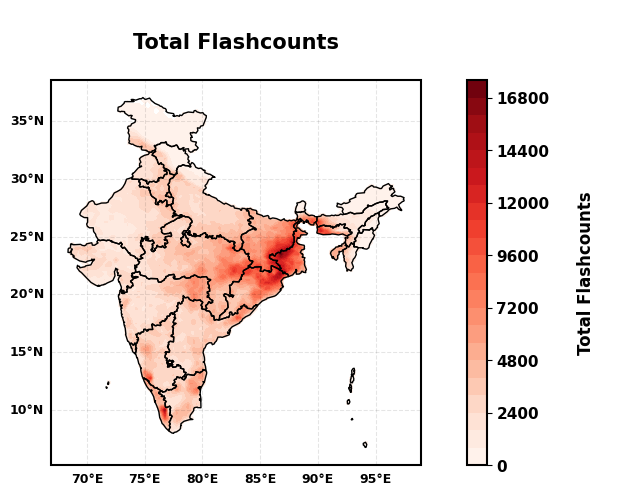

In [4]:
sum = LLN.sum(dim='time')
sum = sum / 5

lons, lats = np.meshgrid(sum.x, sum.y)

# Replace zero values with NaN
sum = sum.where(sum != 0)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, sum, levels=25, cmap='Reds')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Total Flashcounts\n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nTotal Flashcounts\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

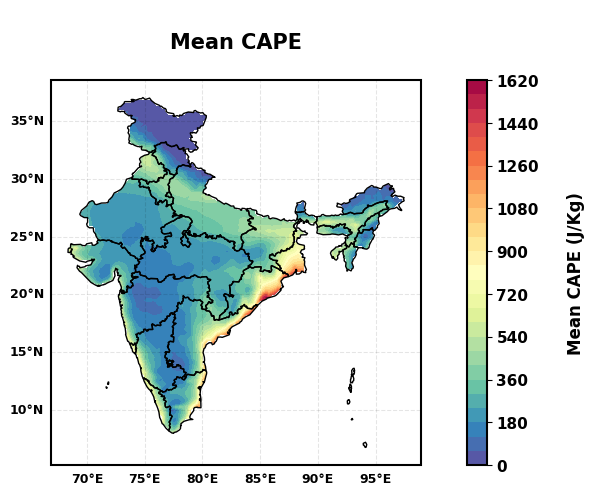

In [25]:
mean = CAPE.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean CAPE (J/Kg)\n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean CAPE\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

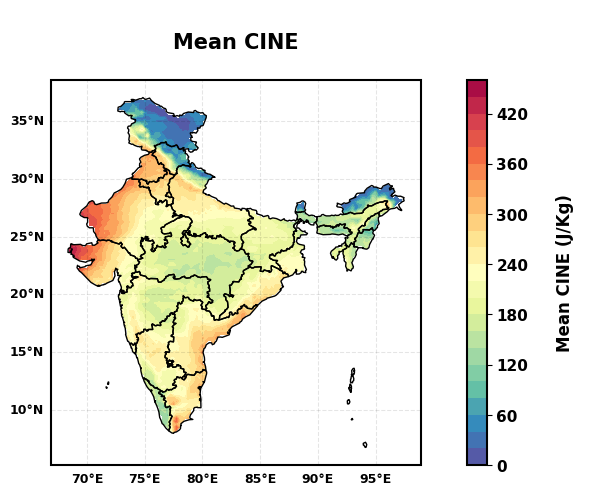

In [27]:

mean = CINE.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean CINE (J/Kg)\n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean CINE\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()


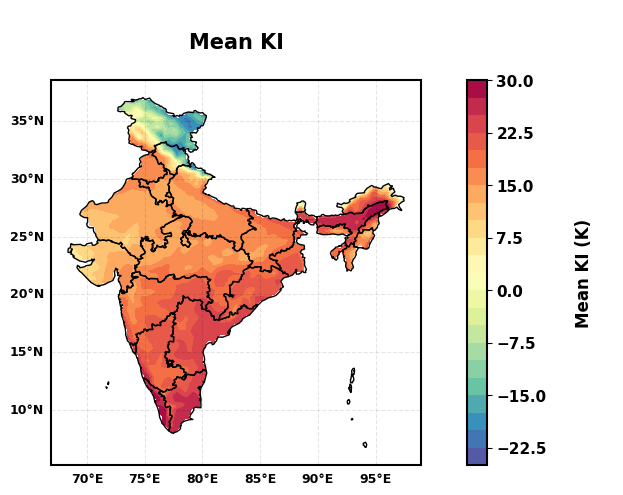

In [28]:
mean = KI.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean KI (K)\n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean KI\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()


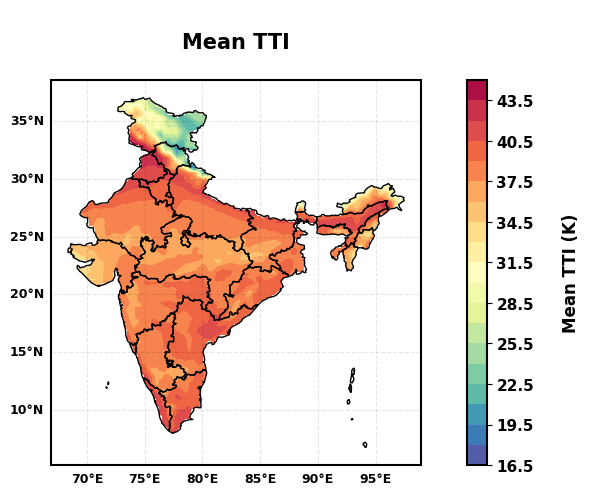

In [29]:
mean = TTI.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean TTI (K)\n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean TTI\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()


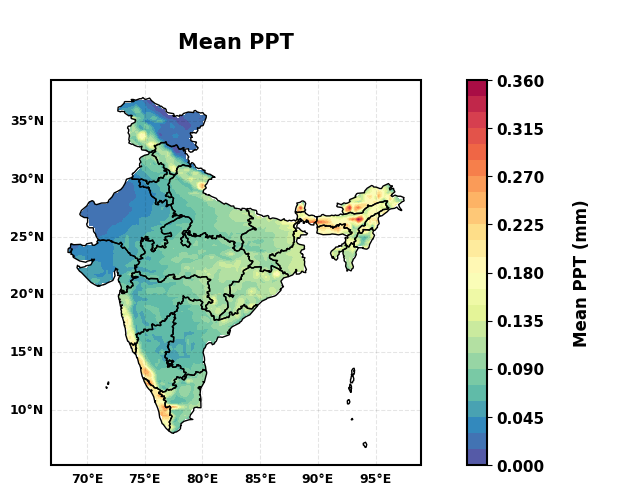

In [30]:
mean = PPT.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean PPT (mm)\n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean PPT\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

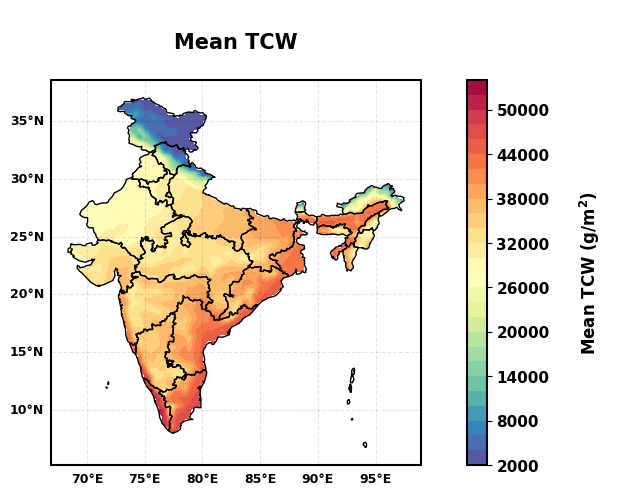

In [31]:
mean = TCW.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean TCW (g/m$^{\mathbf{2}}$)\n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean TCW\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

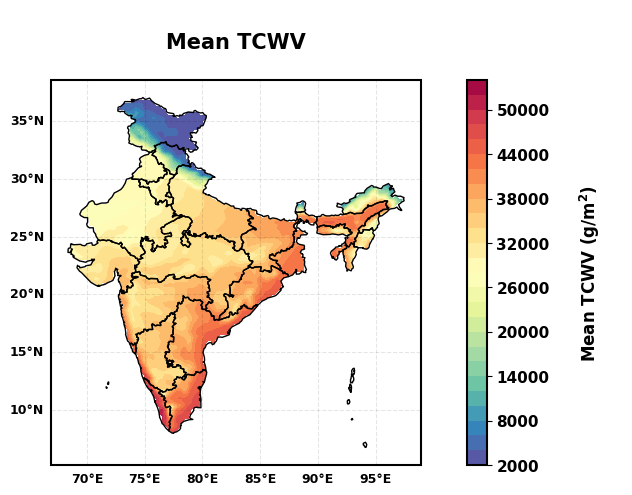

In [32]:
mean = TCWV.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean TCWV (g/m$^{\mathbf{2}}$)\n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean TCWV\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

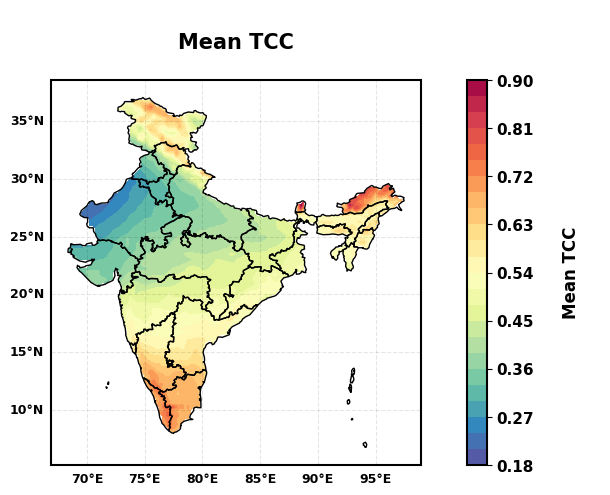

In [33]:
mean = TCC.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean TCC\n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean TCC\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

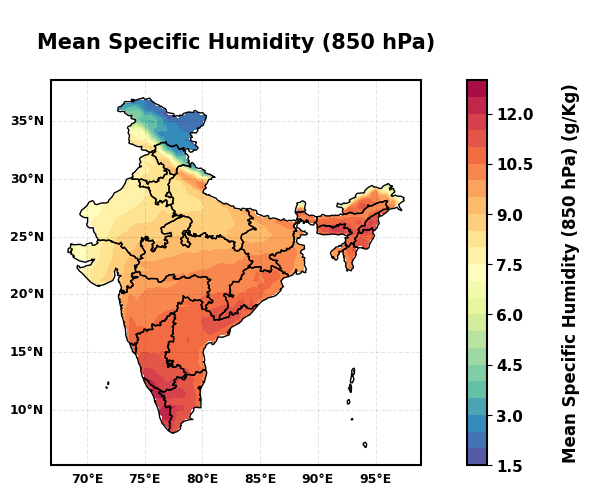

In [34]:
mean = SP_HUM_850.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean Specific Humidity (850 hPa) (g/Kg)\n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean Specific Humidity (850 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

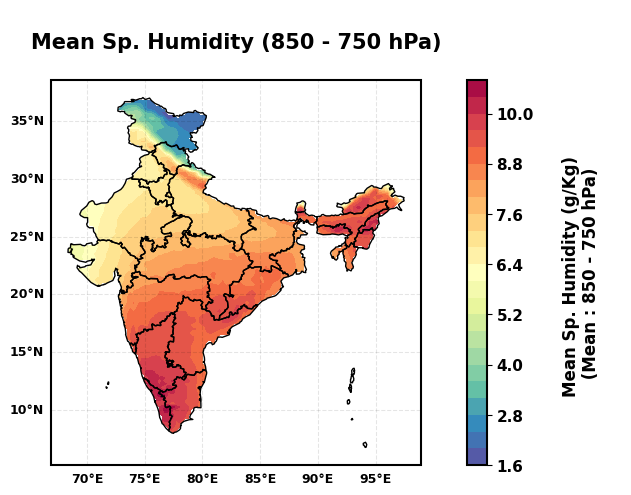

In [35]:
mean = MEAN_SP_HUM_850_750.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean Sp. Humidity (g/Kg) \n (Mean : 850 - 750 hPa) \n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean Sp. Humidity (850 - 750 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

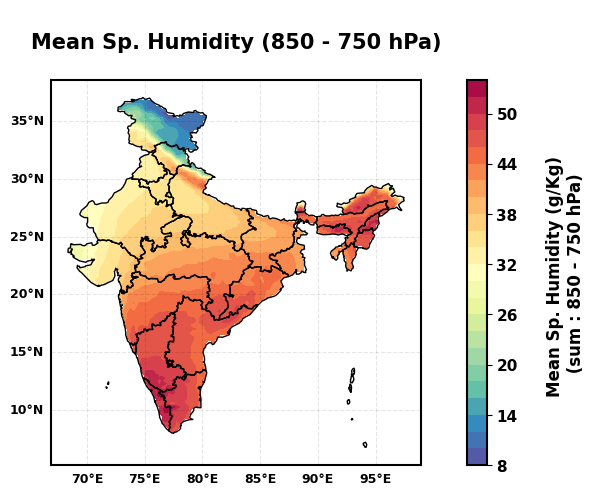

In [36]:
mean = SUM_SP_HUM_850_750.mean(dim='time')
mean = mean.where(mean != 0)

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean Sp. Humidity (g/Kg) \n (sum : 850 - 750 hPa) \n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean Sp. Humidity (850 - 750 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

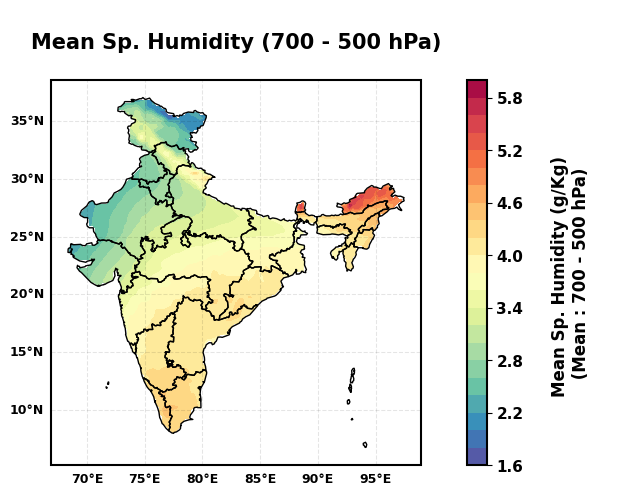

In [37]:
mean = MEAN_SP_HUM_700_500.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean Sp. Humidity (g/Kg) \n (Mean : 700 - 500 hPa) \n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean Sp. Humidity (700 - 500 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

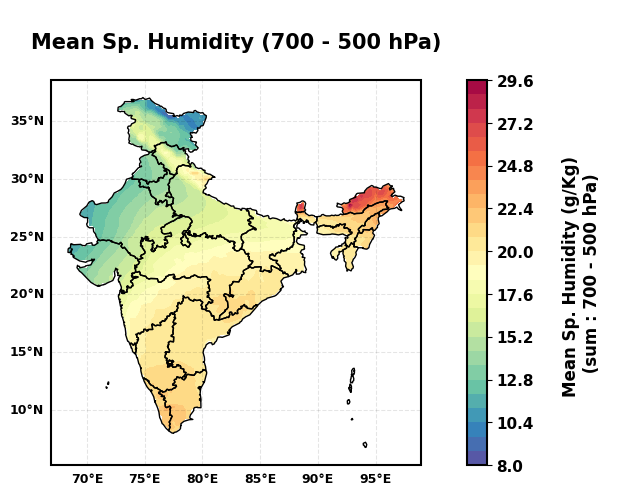

In [38]:
mean = SUM_SP_HUM_700_500.mean(dim='time')
mean = mean.where(mean != 0)

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean Sp. Humidity (g/Kg) \n (sum : 700 - 500 hPa) \n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean Sp. Humidity (700 - 500 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

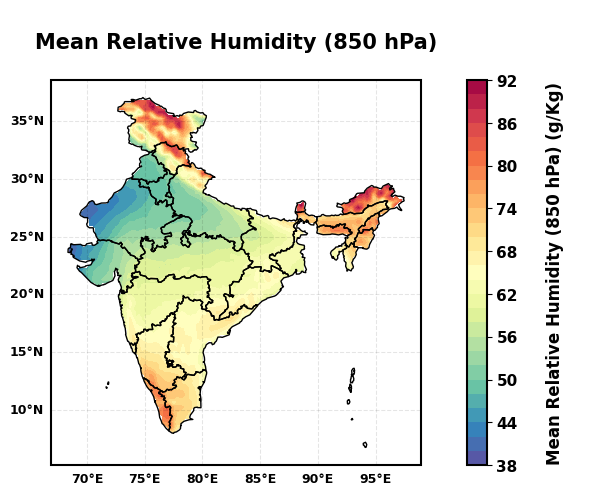

In [39]:
mean = REL_HUM_850.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean Relative Humidity (850 hPa) (g/Kg)\n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean Relative Humidity (850 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

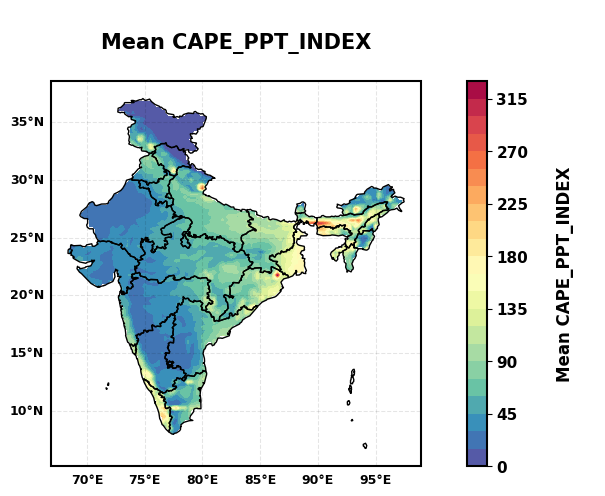

In [40]:
mean = CAPE_PPT_INDEX.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean CAPE_PPT_INDEX\n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean CAPE_PPT_INDEX\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

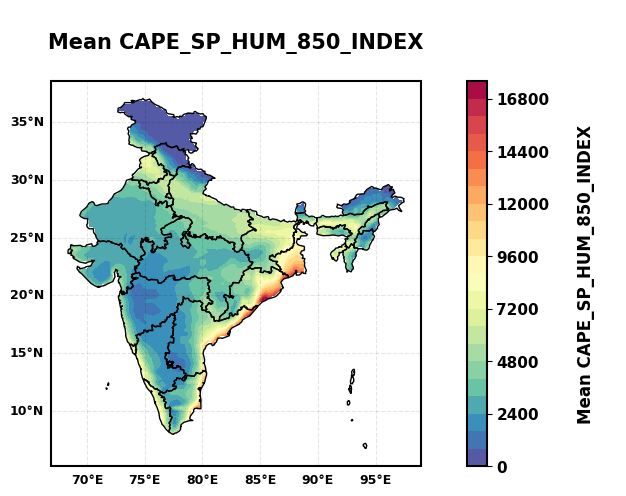

In [41]:
mean = CAPE_SP_HUM_850_INDEX.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean CAPE_SP_HUM_850_INDEX\n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean CAPE_SP_HUM_850_INDEX\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

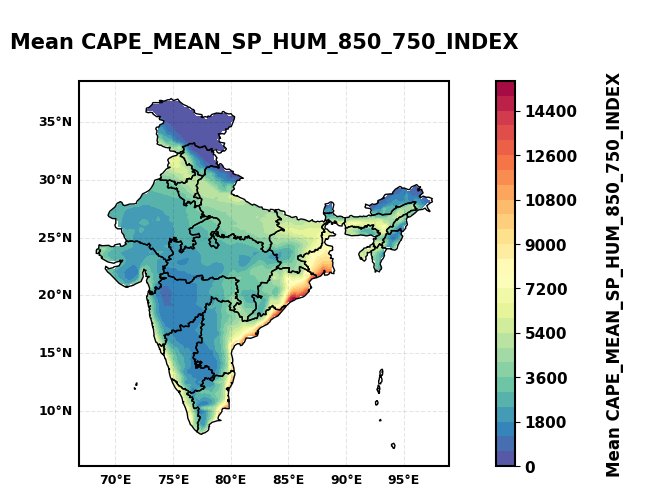

In [6]:
mean = CAPE_MEAN_SP_HUM_850_750_INDEX.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean CAPE_MEAN_SP_HUM_850_750_INDEX\n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean CAPE_MEAN_SP_HUM_850_750_INDEX\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

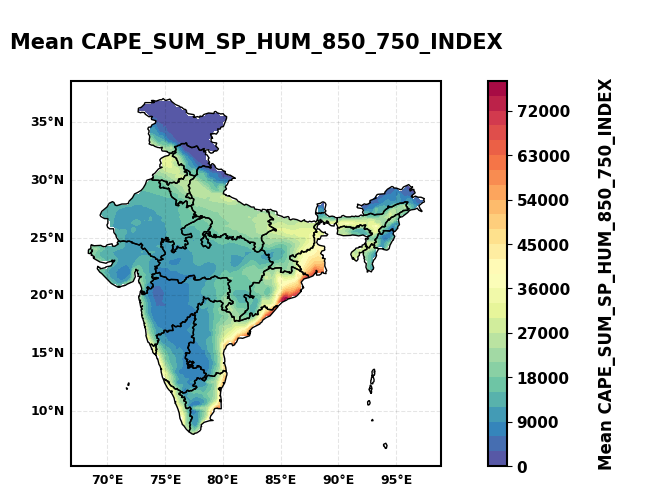

In [7]:
mean = CAPE_SUM_SP_HUM_850_750_INDEX.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean CAPE_SUM_SP_HUM_850_750_INDEX\n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean CAPE_SUM_SP_HUM_850_750_INDEX\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

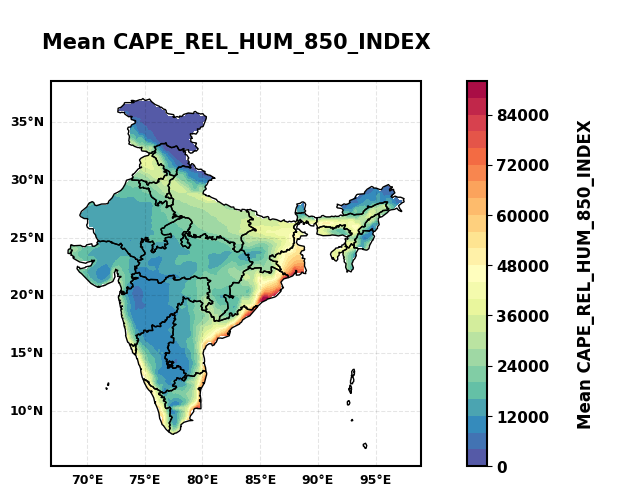

In [8]:
mean = CAPE_REL_HUM_850_INDEX.mean(dim='time')

lons, lats = np.meshgrid(mean.x, mean.y)

plt.figure(figsize=(12, 5))
ax = plt.axes(projection=ccrs.PlateCarree())

contours = ax.contourf(lons, lats, mean, levels=25, cmap='Spectral_r')

cbar = plt.colorbar(contours, orientation='vertical')
cbar.set_label('Mean CAPE_REL_HUM_850_INDEX\n', fontsize=12, fontweight='bold')

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.outline.set_linewidth(1.5)           #  Set the colorbar border thickness

gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 9, 'weight': 'bold'}
gl.ylabel_style = {'size': 9, 'weight': 'bold'}

plt.title('\nMean CAPE_REL_HUM_850_INDEX\n', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for spine in ax.spines.values():
    spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

plt.show()

In [40]:

# variables = [CAPE, CINE, KI, TTI, PPT, TCW, TCWV, TCC, SP_HUM_850, MEAN_SP_HUM_850_750, SUM_SP_HUM_850_750, MEAN_SP_HUM_700_500, SUM_SP_HUM_700_500, REL_HUM_850]  
# titles = ['CAPE', 'CINE', 'KI', 'TTI', 'PPT', 'TCW', 'TCWV', 'TCC', 'SP_HUM_850', 'MEAN_SP_HUM_850_750', 'SUM_SP_HUM_850_750', 
#                         'MEAN_SP_HUM_700_500', 'SUM_SP_HUM_700_500', 'REL_HUM_850']   # Titles for each plot

# nrows = 5
# ncols = 3

# fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 22), subplot_kw={'projection': ccrs.PlateCarree()})

# plt.suptitle('\nFIVE YEAR AVERAGE\n', fontsize=20)

# axes = axes.flatten()

# for i, var in enumerate(variables):

#     mean = var.mean(dim='time')

#     lons, lats = np.meshgrid(mean.x, mean.y)

#     ax = axes[i]

#     contours = ax.contourf(lons, lats, mean, levels=20, cmap='Spectral_r')

#     cbar = plt.colorbar(contours, ax=ax, orientation='vertical')

#     gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.5)
    
#     ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

#     ax.set_title(titles[i], fontsize = 15)

# for j in range(len(variables), nrows * ncols):
#     fig.delaxes(axes[j])

# plt.tight_layout()

# plt.show()


In [37]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    LLN_season = LLN.where(LLN['time.month'].isin(months), drop=True)
    seasonal_sum = LLN_season.sum(dim='time')
    seasonal_sum_norm = seasonal_sum / 5
    global_min = min(global_min, seasonal_sum_norm.min().item())
    global_max = max(global_max, seasonal_sum_norm.max().item())

print(global_min)
print(global_max)

0.0
10353.2


/tmp/ipykernel_301590/222641032.py:70: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


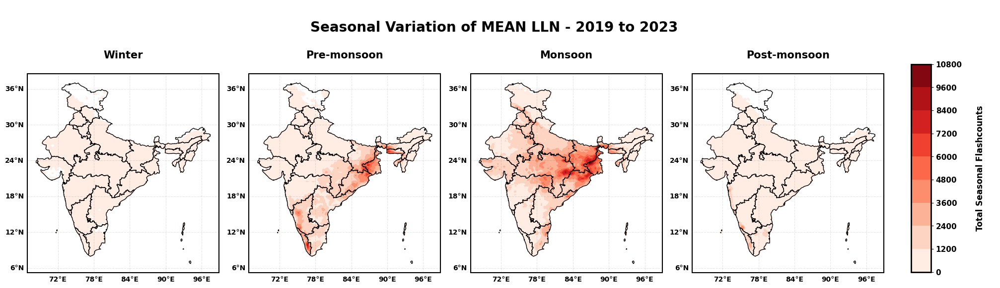

In [38]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    LLN_season = LLN.where(LLN['time.month'].isin(months), drop=True)
    seasonal_sum = LLN_season.sum(dim='time')
    seasonal_sum_norm = seasonal_sum / 5
    global_min = min(global_min, seasonal_sum_norm.min().item())
    global_max = max(global_max, seasonal_sum_norm.max().item())

plt.suptitle('\nSeasonal Variation of MEAN LLN - 2019 to 2023\n', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 12000, 1200)

for i, (season, months) in enumerate(seasons.items()):
    LLN_season = LLN.where(LLN['time.month'].isin(months), drop=True)
    seasonal_sum = LLN_season.sum(dim='time')
    seasonal_sum_norm = seasonal_sum / 5

    # Replace zero values with NaN
    seasonal_sum_norm = seasonal_sum_norm.where(seasonal_sum_norm != 0)

    lons, lats = np.meshgrid(seasonal_sum_norm.x, seasonal_sum_norm.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_sum_norm, cmap='Reds', levels=custom_levels)  # Use global min and max

    # gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.5)

    # ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')
    
    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Total Seasonal Flashcounts\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()


In [ ]:
shortforms = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']
full_names = ['CAPE', 'KI', 'TTI', 'PPT', 'Sp. Hum (850 hPa)', 'Sp. Hum (MEAN from 850 - 750 hPa)', 'Sp. Hum (SUM from 850 - 750 hPa)', 'Rel. Hum (850 hPa)', 'CAPE x PPT_INDEX', 
              'CAPE x Sp. Hum (850 hPa) INDEX', 'CAPE x Sp. Hum (MEAN from 850 - 750 hPa) INDEX', 'CAPE x Sp. Hum (SUM from 850 - 750 hPa) INDEX', 'CAPE x Rel. Hum (850 hPa) INDEX']

correlation_data = []

for var in variables_to_compare:
    correlation_flattened = correlation_values[var].values.flatten()
    correlation_data.append(correlation_flattened)

plt.figure(figsize=(14, 6))  
# palette = sns.color_palette() 

palette = [  
    "#1f77b4",  # blue  
    "#ff7f0e",  # orange  
    "#2ca02c",  # green  
    "#17becf",  # cyan 
    "#bcbd22",  # olive 
    "#8c564b",  # brown  
    "#e377c2",  # pink  
    "#7f7f7f",  # gray  
    "#9467bd",  # purple 
    "#d62728",  # red 
    "#ADD8E6",  # light blue  
    "#FBDD7E",  # wheat  
    "#a0522d"   # sienna  
]   
 
sns.boxplot(data=correlation_data, showfliers=False, palette=palette, width=0.5, linewidth=1.5)  # Thicker box plot lines

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(ticks=np.arange(len(variables_to_compare)), labels=shortforms, rotation=0, fontsize=12, fontweight='bold')
plt.title('\nBox Plot of Spatial Correlation Coefficients\n', fontsize=15, fontweight='bold')
plt.xlabel('\nDifferent variables\n', fontsize=12, fontweight='bold')
plt.ylabel('\nCorrelation Coefficient\n', fontsize=12, fontweight='bold')

# Adjust the y-axis limits
# plt.ylim(-0.04, 0.16)

# Thicken the frame of the plot
ax = plt.gca()
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

handles = [plt.Line2D([0], [0], color=palette[i], lw=4, label=f'{short}: {full}') for i, (short, full) in enumerate(zip(shortforms, full_names))]
legend = plt.legend(handles=handles, loc='center left', bbox_to_anchor=(1, 0.5), title='Legend', frameon=True)
legend.get_frame().set_linewidth(2) 


plt.tight_layout()
plt.show()

In [39]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    cape_season = CAPE.where(CAPE['time.month'].isin(months), drop=True)
    seasonal_mean = cape_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

1.6570814847946167
3228.375732421875


/tmp/ipykernel_301590/2243155354.py:62: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


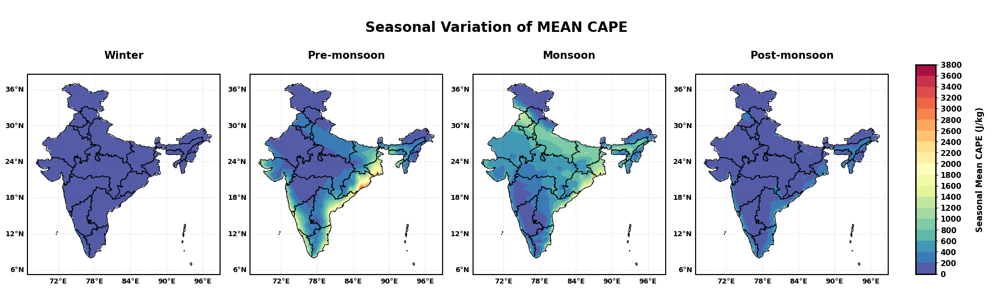

In [86]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    cape_season = CAPE.where(CAPE['time.month'].isin(months), drop=True)
    seasonal_mean = cape_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN CAPE\n ', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 4000, 200)

for i, (season, months) in enumerate(seasons.items()):
    cape_season = CAPE.where(CAPE['time.month'].isin(months), drop=True)
    seasonal_mean = cape_season.mean(dim='time')

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')


cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean CAPE (J/kg)\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()

In [42]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    CINE_season = CINE.where(CINE['time.month'].isin(months), drop=True)
    seasonal_mean = CINE_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

0.015228271484375
691.3732299804688


/tmp/ipykernel_301590/1543597742.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


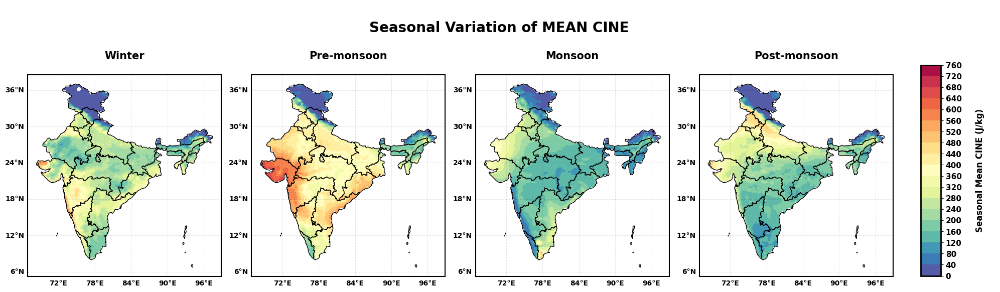

In [87]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    CINE_season = CINE.where(CINE['time.month'].isin(months), drop=True)
    seasonal_mean = CINE_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN CINE\n ', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 800, 40)

for i, (season, months) in enumerate(seasons.items()):
    CINE_season = CINE.where(CINE['time.month'].isin(months), drop=True)
    seasonal_mean = CINE_season.mean(dim='time')

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean CINE (J/kg)\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()

In [44]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    KI_season = KI.where(KI['time.month'].isin(months), drop=True)
    seasonal_mean = KI_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

-36.20803451538086
37.90041732788086


/tmp/ipykernel_301590/3828557814.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


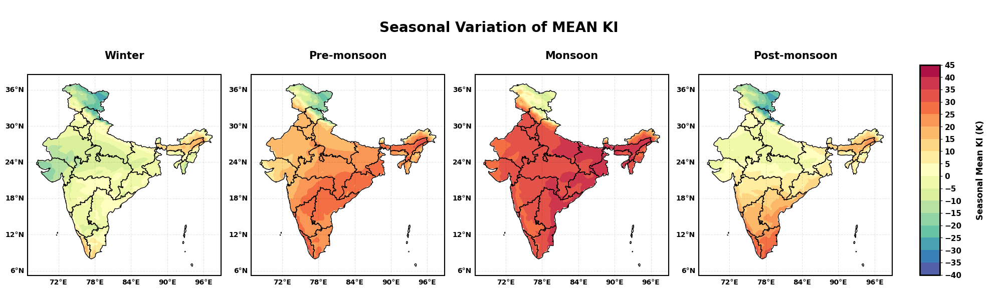

In [45]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    KI_season = KI.where(KI['time.month'].isin(months), drop=True)
    seasonal_mean = KI_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN KI\n ', fontsize=20, fontweight='bold')

custom_levels = np.arange(-40, 50, 5)

for i, (season, months) in enumerate(seasons.items()):
    KI_season = KI.where(KI['time.month'].isin(months), drop=True)
    seasonal_mean = KI_season.mean(dim='time')

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean KI (K)\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()

In [46]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    TTI_season = TTI.where(TTI['time.month'].isin(months), drop=True)
    seasonal_mean = TTI_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

12.816544532775879
46.42527770996094


/tmp/ipykernel_301590/4292553780.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


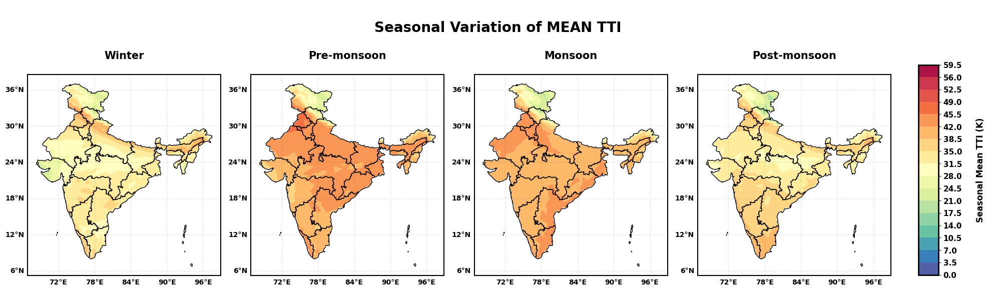

In [47]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    TTI_season = TTI.where(TTI['time.month'].isin(months), drop=True)
    seasonal_mean = TTI_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN TTI\n ', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 60, 3.5)

for i, (season, months) in enumerate(seasons.items()):
    TTI_season = TTI.where(TTI['time.month'].isin(months), drop=True)
    seasonal_mean = TTI_season.mean(dim='time')

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean TTI (K)\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()

In [48]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    PPT_season = PPT.where(PPT['time.month'].isin(months), drop=True)
    seasonal_mean = PPT_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

2.315836536581628e-05
0.6599804162979126


/tmp/ipykernel_301590/2399560199.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


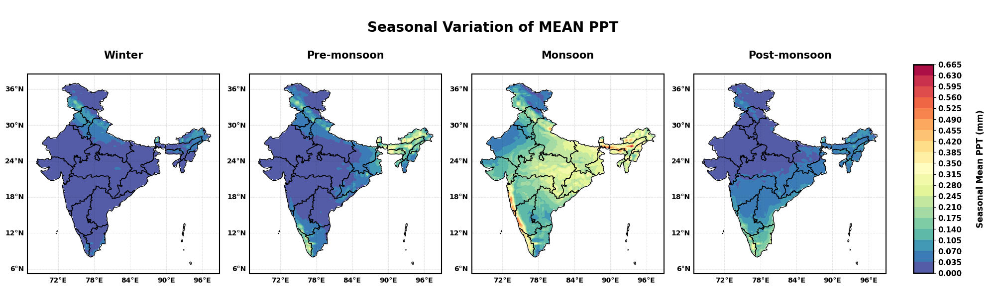

In [49]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    PPT_season = PPT.where(PPT['time.month'].isin(months), drop=True)
    seasonal_mean = PPT_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN PPT \n', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 0.7, 0.035)

for i, (season, months) in enumerate(seasons.items()):
    PPT_season = PPT.where(PPT['time.month'].isin(months), drop=True)
    seasonal_mean = PPT_season.mean(dim='time')

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean PPT (mm)\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()

In [50]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    TCW_season = TCW.where(TCW['time.month'].isin(months), drop=True)
    seasonal_mean = TCW_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

734.2356567382812
68535.5078125


/tmp/ipykernel_301590/4289302046.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


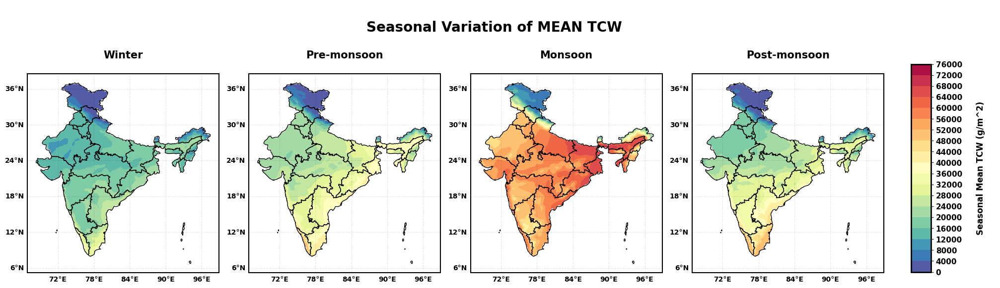

In [51]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    TCW_season = TCW.where(TCW['time.month'].isin(months), drop=True)
    seasonal_mean = TCW_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN TCW\n ', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 80000, 4000)

for i, (season, months) in enumerate(seasons.items()):
    TCW_season = TCW.where(TCW['time.month'].isin(months), drop=True)
    seasonal_mean = TCW_season.mean(dim='time')

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean TCW (g/m^2)\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()

In [52]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    TCWV_season = TCWV.where(TCWV['time.month'].isin(months), drop=True)
    seasonal_mean = TCWV_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

710.9035034179688
67978.40625


/tmp/ipykernel_301590/176813658.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


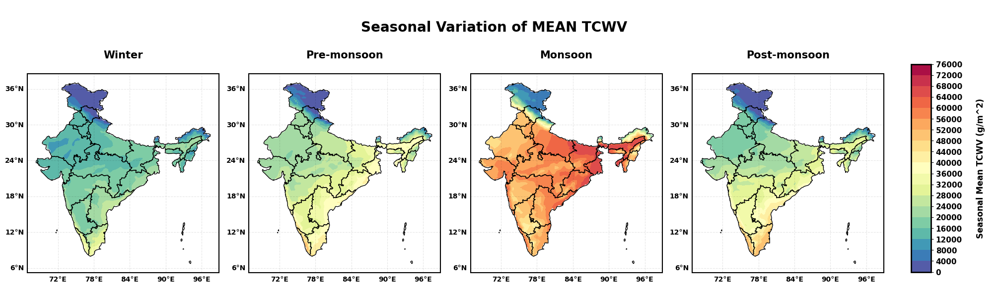

In [53]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    TCWV_season = TCWV.where(TCWV['time.month'].isin(months), drop=True)
    seasonal_mean = TCWV_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN TCWV\n ', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 80000, 4000)

for i, (season, months) in enumerate(seasons.items()):
    TCWV_season = TCWV.where(TCWV['time.month'].isin(months), drop=True)
    seasonal_mean = TCWV_season.mean(dim='time')

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean TCWV (g/m^2)\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()

In [54]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    TCC_season = TCC.where(TCC['time.month'].isin(months), drop=True)
    seasonal_mean = TCC_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

0.06417258083820343
0.9628934860229492


/tmp/ipykernel_301590/3426411980.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


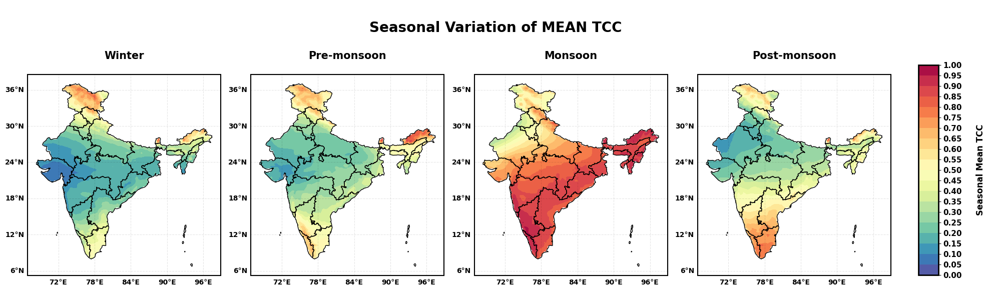

In [55]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    TCC_season = TCC.where(TCC['time.month'].isin(months), drop=True)
    seasonal_mean = TCC_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN TCC \n', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 1.05, 0.05)

for i, (season, months) in enumerate(seasons.items()):
    TCC_season = TCC.where(TCC['time.month'].isin(months), drop=True)
    seasonal_mean = TCC_season.mean(dim='time')

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean TCC\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()

In [56]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    SP_HUM_850_season = SP_HUM_850.where(SP_HUM_850['time.month'].isin(months), drop=True)
    seasonal_mean = SP_HUM_850_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

0.5700679421424866
15.96056079864502


/tmp/ipykernel_301590/3198623404.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


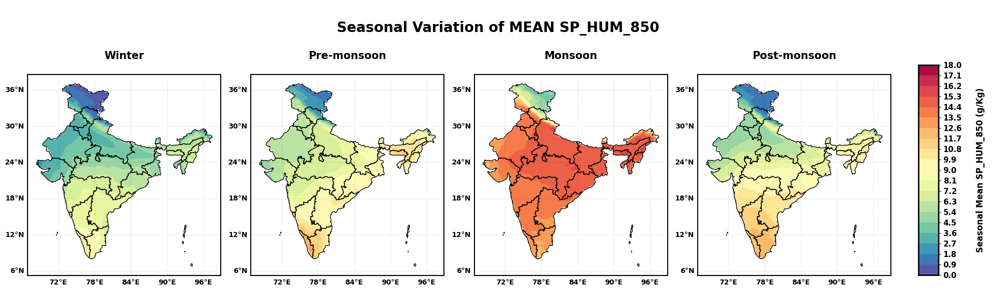

In [57]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    SP_HUM_850_season = SP_HUM_850.where(SP_HUM_850['time.month'].isin(months), drop=True)
    seasonal_mean = SP_HUM_850_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN SP_HUM_850\n ', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 18.9, 0.9)

for i, (season, months) in enumerate(seasons.items()):
    SP_HUM_850_season = SP_HUM_850.where(SP_HUM_850['time.month'].isin(months), drop=True)
    seasonal_mean = SP_HUM_850_season.mean(dim='time')

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean SP_HUM_850 (g/Kg)\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()

In [58]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    MEAN_SP_HUM_850_750_season = MEAN_SP_HUM_850_750.where(MEAN_SP_HUM_850_750['time.month'].isin(months), drop=True)
    seasonal_mean = MEAN_SP_HUM_850_750_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

0.5700674653053284
14.39035415649414


/tmp/ipykernel_301590/2251176443.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


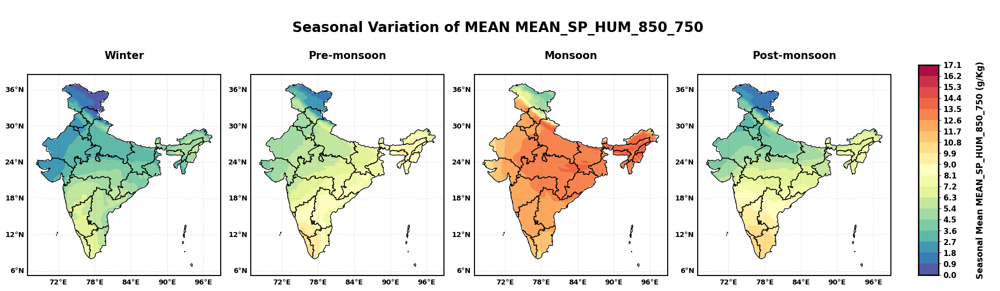

In [59]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    MEAN_SP_HUM_850_750_season = MEAN_SP_HUM_850_750.where(MEAN_SP_HUM_850_750['time.month'].isin(months), drop=True)
    seasonal_mean = MEAN_SP_HUM_850_750_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN MEAN_SP_HUM_850_750\n ', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 18, 0.9)

for i, (season, months) in enumerate(seasons.items()):
    MEAN_SP_HUM_850_750_season = MEAN_SP_HUM_850_750.where(MEAN_SP_HUM_850_750['time.month'].isin(months), drop=True)
    seasonal_mean = MEAN_SP_HUM_850_750_season.mean(dim='time')

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean MEAN_SP_HUM_850_750 (g/Kg)\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()

In [60]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    SUM_SP_HUM_850_750_season = SUM_SP_HUM_850_750.where(SUM_SP_HUM_850_750['time.month'].isin(months), drop=True)
    seasonal_mean = SUM_SP_HUM_850_750_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

0.0
71.9521484375


/tmp/ipykernel_301590/4158963676.py:64: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


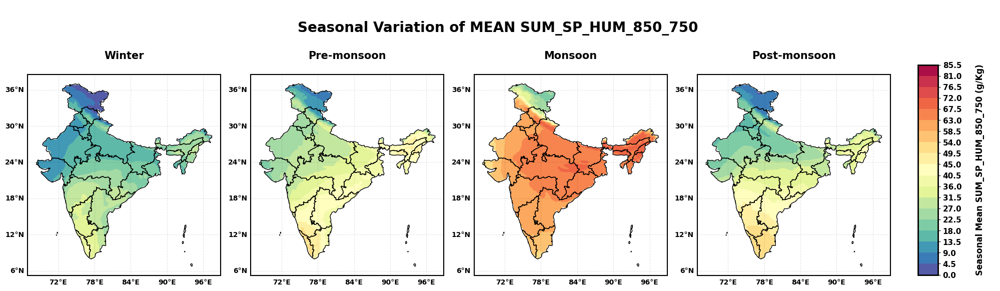

In [61]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    SUM_SP_HUM_850_750_season = SUM_SP_HUM_850_750.where(SUM_SP_HUM_850_750['time.month'].isin(months), drop=True)
    seasonal_mean = SUM_SP_HUM_850_750_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN SUM_SP_HUM_850_750\n ', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 90, 4.5)

for i, (season, months) in enumerate(seasons.items()):
    SUM_SP_HUM_850_750_season = SUM_SP_HUM_850_750.where(SUM_SP_HUM_850_750['time.month'].isin(months), drop=True)
    seasonal_mean = SUM_SP_HUM_850_750_season.mean(dim='time')

    # Replace zero values with NaN
    seasonal_mean = seasonal_mean.where(seasonal_mean != 0)

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean SUM_SP_HUM_850_750 (g/Kg)\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()


In [62]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    REL_HUM_850_season = REL_HUM_850.where(REL_HUM_850['time.month'].isin(months), drop=True)
    seasonal_mean = REL_HUM_850_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

20.940340042114258
99.99288940429688


/tmp/ipykernel_301590/556182644.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


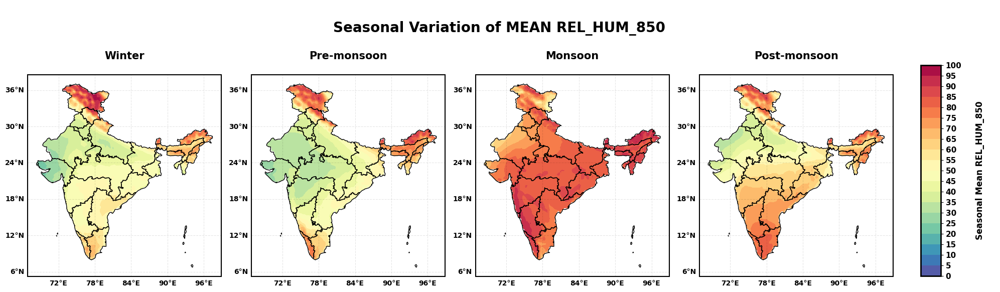

In [63]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    REL_HUM_850_season = REL_HUM_850.where(REL_HUM_850['time.month'].isin(months), drop=True)
    seasonal_mean = REL_HUM_850_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN REL_HUM_850\n ', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 105, 5)

for i, (season, months) in enumerate(seasons.items()):
    REL_HUM_850_season = REL_HUM_850.where(REL_HUM_850['time.month'].isin(months), drop=True)
    seasonal_mean = REL_HUM_850_season.mean(dim='time')

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean REL_HUM_850\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()


In [69]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    CAPE_PPT_INDEX_season = CAPE_PPT_INDEX.where(CAPE_PPT_INDEX['time.month'].isin(months), drop=True)
    seasonal_mean = CAPE_PPT_INDEX_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

0.00043347853352315724
600.4622802734375


/tmp/ipykernel_301590/3118534497.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


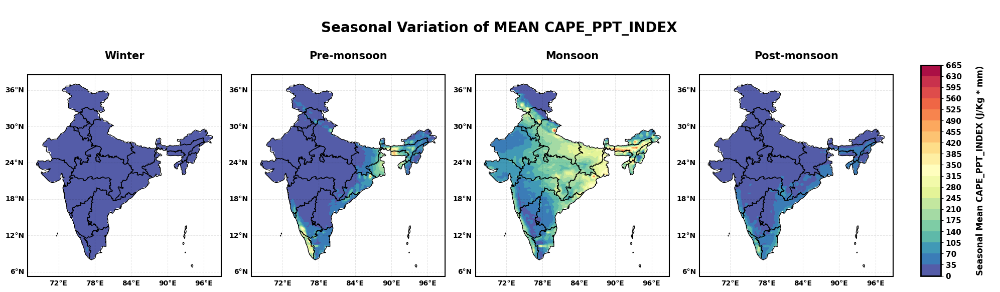

In [70]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    CAPE_PPT_INDEX_season = CAPE_PPT_INDEX.where(CAPE_PPT_INDEX['time.month'].isin(months), drop=True)
    seasonal_mean = CAPE_PPT_INDEX_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN CAPE_PPT_INDEX\n ', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 700, 35)

for i, (season, months) in enumerate(seasons.items()):
    CAPE_PPT_INDEX_season = CAPE_PPT_INDEX.where(CAPE_PPT_INDEX['time.month'].isin(months), drop=True)
    seasonal_mean = CAPE_PPT_INDEX_season.mean(dim='time')

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean CAPE_PPT_INDEX (J/Kg * mm)\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()

In [71]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    CAPE_SP_HUM_850_INDEX_season = CAPE_SP_HUM_850_INDEX.where(CAPE_SP_HUM_850_INDEX['time.month'].isin(months), drop=True)
    seasonal_mean = CAPE_SP_HUM_850_INDEX_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

3.0317165851593018
29315.0


/tmp/ipykernel_301590/2883215605.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


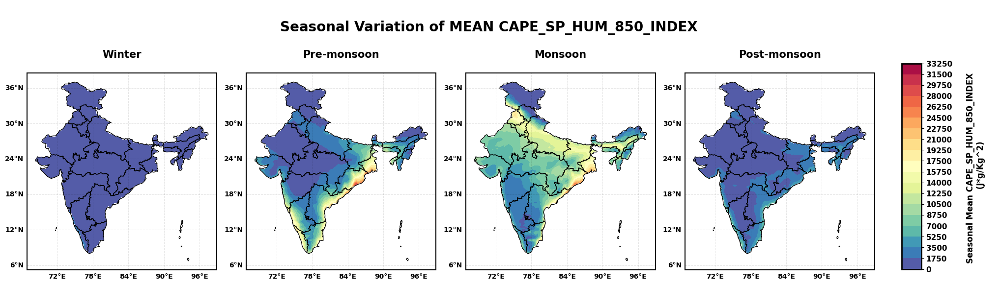

In [74]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    CAPE_SP_HUM_850_INDEX_season = CAPE_SP_HUM_850_INDEX.where(CAPE_SP_HUM_850_INDEX['time.month'].isin(months), drop=True)
    seasonal_mean = CAPE_SP_HUM_850_INDEX_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN CAPE_SP_HUM_850_INDEX\n ', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 35000, 1750)

for i, (season, months) in enumerate(seasons.items()):
    CAPE_SP_HUM_850_INDEX_season = CAPE_SP_HUM_850_INDEX.where(CAPE_SP_HUM_850_INDEX['time.month'].isin(months), drop=True)
    seasonal_mean = CAPE_SP_HUM_850_INDEX_season.mean(dim='time')

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean CAPE_SP_HUM_850_INDEX \n (J*g/Kg^2)\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()

In [75]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    CAPE_MEAN_SP_HUM_850_750_INDEX_season = CAPE_MEAN_SP_HUM_850_750_INDEX.where(CAPE_MEAN_SP_HUM_850_750_INDEX['time.month'].isin(months), drop=True)
    seasonal_mean = CAPE_MEAN_SP_HUM_850_750_INDEX_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

3.031686782836914
25326.22265625


/tmp/ipykernel_301590/3286394905.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


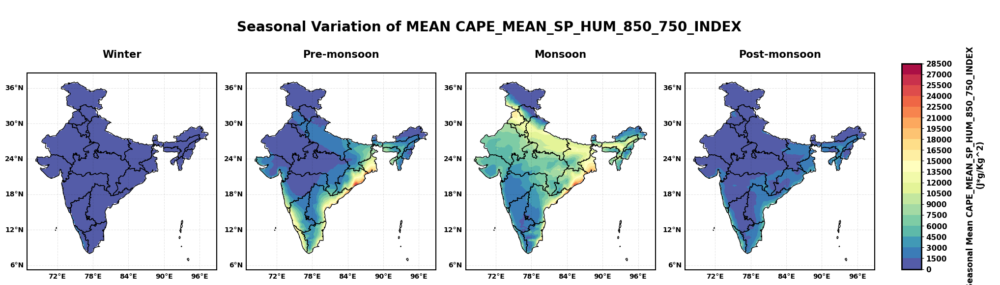

In [76]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    CAPE_MEAN_SP_HUM_850_750_INDEX_season = CAPE_MEAN_SP_HUM_850_750_INDEX.where(CAPE_MEAN_SP_HUM_850_750_INDEX['time.month'].isin(months), drop=True)
    seasonal_mean = CAPE_MEAN_SP_HUM_850_750_INDEX_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN CAPE_MEAN_SP_HUM_850_750_INDEX\n ', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 30000, 1500)

for i, (season, months) in enumerate(seasons.items()):
    CAPE_MEAN_SP_HUM_850_750_INDEX_season = CAPE_MEAN_SP_HUM_850_750_INDEX.where(CAPE_MEAN_SP_HUM_850_750_INDEX['time.month'].isin(months), drop=True)
    seasonal_mean = CAPE_MEAN_SP_HUM_850_750_INDEX_season.mean(dim='time')

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean CAPE_MEAN_SP_HUM_850_750_INDEX \n (J*g/Kg^2)\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()

In [77]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    CAPE_SUM_SP_HUM_850_750_INDEX_season = CAPE_SUM_SP_HUM_850_750_INDEX.where(CAPE_SUM_SP_HUM_850_750_INDEX['time.month'].isin(months), drop=True)
    seasonal_mean = CAPE_SUM_SP_HUM_850_750_INDEX_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

15.158434867858887
126630.7734375


/tmp/ipykernel_301590/1608843208.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


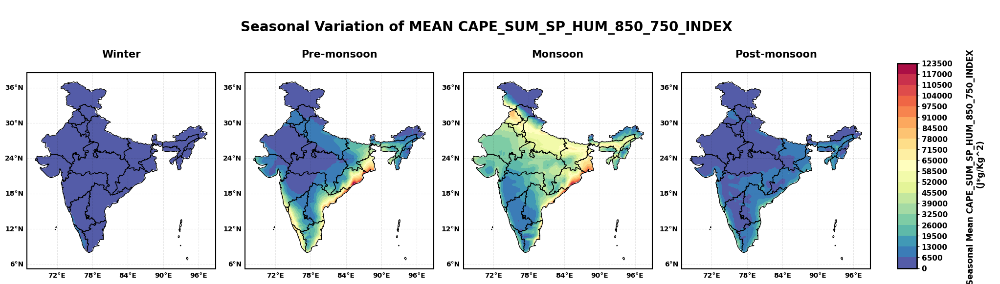

In [78]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    CAPE_SUM_SP_HUM_850_750_INDEX_season = CAPE_SUM_SP_HUM_850_750_INDEX.where(CAPE_SUM_SP_HUM_850_750_INDEX['time.month'].isin(months), drop=True)
    seasonal_mean = CAPE_SUM_SP_HUM_850_750_INDEX_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN CAPE_SUM_SP_HUM_850_750_INDEX\n ', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 130000, 6500)

for i, (season, months) in enumerate(seasons.items()):
    CAPE_SUM_SP_HUM_850_750_INDEX_season = CAPE_SUM_SP_HUM_850_750_INDEX.where(CAPE_SUM_SP_HUM_850_750_INDEX['time.month'].isin(months), drop=True)
    seasonal_mean = CAPE_SUM_SP_HUM_850_750_INDEX_season.mean(dim='time')

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean CAPE_SUM_SP_HUM_850_750_INDEX \n (J*g/Kg^2)\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()

In [79]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    CAPE_REL_HUM_850_INDEX_season = CAPE_REL_HUM_850_INDEX.where(CAPE_REL_HUM_850_INDEX['time.month'].isin(months), drop=True)
    seasonal_mean = CAPE_REL_HUM_850_INDEX_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

print(global_min)
print(global_max)

106.32855224609375
144244.5


/tmp/ipykernel_301590/669784783.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar


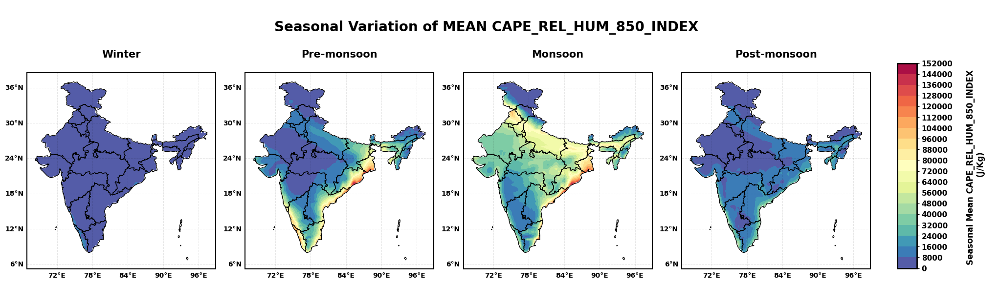

In [80]:
seasons = {'Winter': [1, 2], 'Pre-monsoon': [3, 4, 5], 'Monsoon': [6, 7, 8, 9], 'Post-monsoon': [10, 11, 12]}

fig, axes = plt.subplots(1, 4, figsize=(20, 6), subplot_kw={'projection': ccrs.PlateCarree()})

global_min = float('inf')
global_max = float('-inf')

for season, months in seasons.items():
    CAPE_REL_HUM_850_INDEX_season = CAPE_REL_HUM_850_INDEX.where(CAPE_REL_HUM_850_INDEX['time.month'].isin(months), drop=True)
    seasonal_mean = CAPE_REL_HUM_850_INDEX_season.mean(dim='time')
    global_min = min(global_min, seasonal_mean.min().item())
    global_max = max(global_max, seasonal_mean.max().item())

plt.suptitle('\nSeasonal Variation of MEAN CAPE_REL_HUM_850_INDEX\n ', fontsize=20, fontweight='bold')

custom_levels = np.arange(0, 160000, 8000)

for i, (season, months) in enumerate(seasons.items()):
    CAPE_REL_HUM_850_INDEX_season = CAPE_REL_HUM_850_INDEX.where(CAPE_REL_HUM_850_INDEX['time.month'].isin(months), drop=True)
    seasonal_mean = CAPE_REL_HUM_850_INDEX_season.mean(dim='time')

    lons, lats = np.meshgrid(seasonal_mean.x, seasonal_mean.y)  # Ensure correct lon and lat

    ax = axes[i]

    contours = ax.contourf(lons, lats, seasonal_mean, cmap='Spectral_r', levels=custom_levels)  # Use global min and max

    gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, transform=ccrs.PlateCarree())

    gl = ax.gridlines(draw_labels=True, color='black', alpha=0.1, linestyle='--')

    gl.xlocator = plt.MultipleLocator(6)  # Every 2 degrees longitude
    gl.ylocator = plt.MultipleLocator(6)  # Every 2 degrees latitude

    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold'}

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)                 # Set the meshgrid outer border thickness

    ax.set_title(f'\n{season}\n', fontsize=15, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

cbar_ax = fig.add_axes([0.92, 0.08, 0.02, 0.7])  # Adjust position [left, bottom, width, height]
cbar = fig.colorbar(contours, cax=cbar_ax, orientation='vertical')
cbar.set_ticks(custom_levels)
cbar.ax.yaxis.set_tick_params(labelsize='11')
cbar.ax.yaxis.labelpad = 20             # Adjust this value to increase the space

cbar.set_label('Seasonal Mean CAPE_REL_HUM_850_INDEX \n (J/Kg)\n', fontsize=12, fontweight='bold')

cbar.outline.set_linewidth(2)           #  Set the colorbar border thickness

for label in cbar.ax.yaxis.get_ticklabels():  
    label.set_fontsize(11)              # Set fontsize  
    label.set_fontweight('bold')        # Set bold  

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make room for the colorbar
plt.subplots_adjust(top=0.80)  # Adjust top to make room for the suptitle
# plt.subplots_adjust(hspace=0.6, wspace=0.1)  # Adjust horizontal and vertical spacing
plt.show()

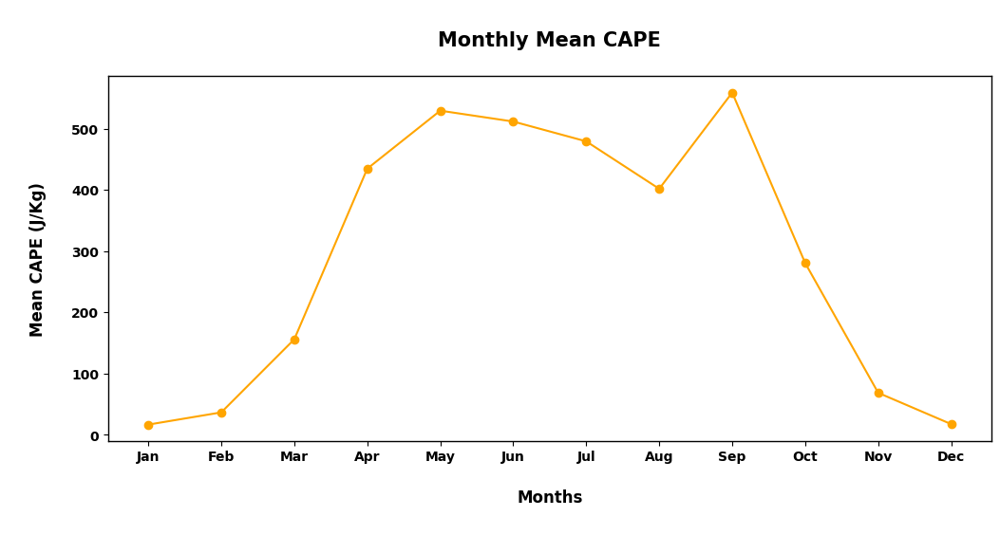

In [161]:
CAPE_monthwise = CAPE.groupby(CAPE['time.month'])

CAPE_monthwise_mean = CAPE_monthwise.mean(dim=('x', 'y', 'time'))

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.figure(figsize=(12, 5))

plt.plot(months, CAPE_monthwise_mean, marker='o', color='Orange')

plt.title('\nMonthly Mean CAPE\n', fontsize=15, fontweight='bold')
plt.xlabel('\nMonths\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean CAPE (J/Kg)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')

ax = plt.gca()
ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

# plt.grid()

plt.show()

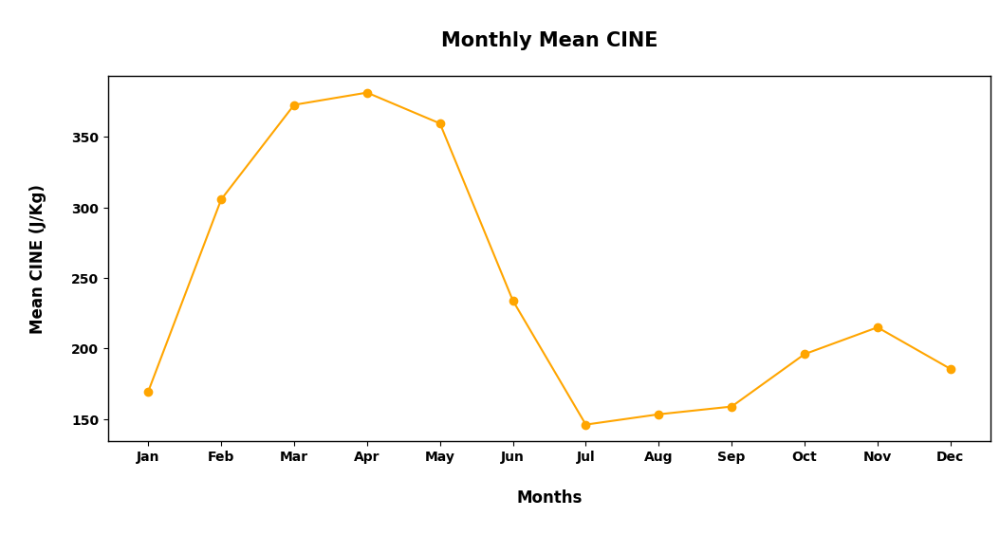

In [162]:
CINE_monthwise = CINE.groupby(CINE['time.month'])

CINE_monthwise_mean = CINE_monthwise.mean(dim=('x', 'y', 'time'))

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.figure(figsize=(12, 5))

plt.plot(months, CINE_monthwise_mean, marker='o', color='Orange')

plt.title('\nMonthly Mean CINE\n', fontsize=15, fontweight='bold')
plt.xlabel('\nMonths\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean CINE (J/Kg)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.show()

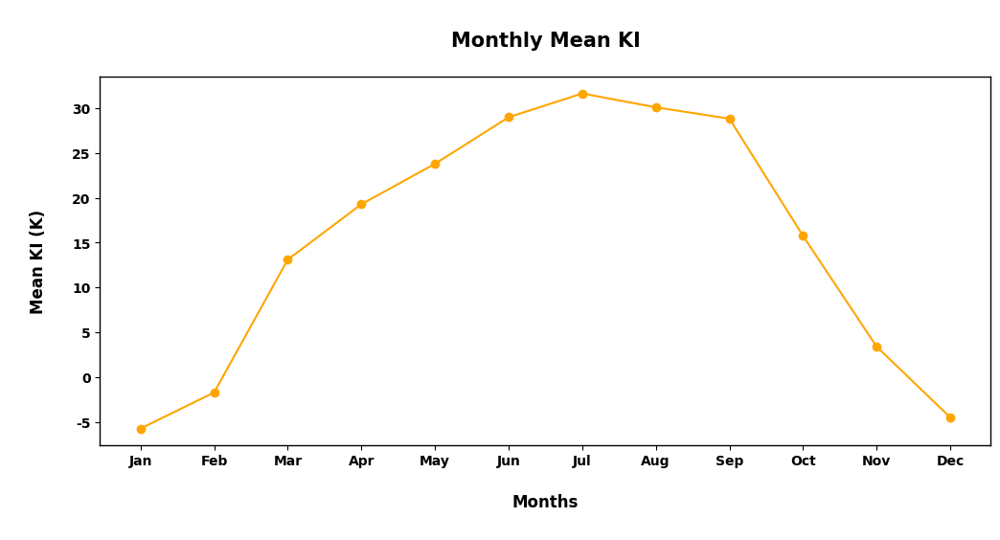

In [163]:
KI_monthwise = KI.groupby(KI['time.month'])

KI_monthwise_mean = KI_monthwise.mean(dim=('x', 'y', 'time'))

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.figure(figsize=(12, 5))

plt.plot(months, KI_monthwise_mean, marker='o', color='Orange')

plt.title('\nMonthly Mean KI\n', fontsize=15, fontweight='bold')
plt.xlabel('\nMonths\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean KI (K)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.show()

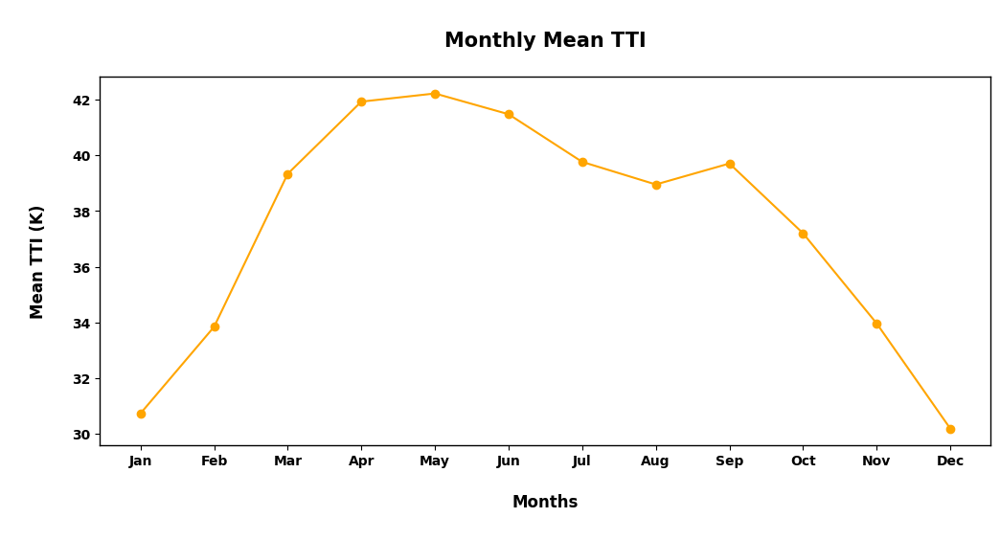

: 

In [204]:
TTI_monthwise = TTI.groupby(TTI['time.month'])

TTI_monthwise_mean = TTI_monthwise.mean(dim=('x', 'y', 'time'))

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.figure(figsize=(12, 5))

plt.plot(months, TTI_monthwise_mean, marker='o', color='Orange')

plt.title('\nMonthly Mean TTI\n', fontsize=15, fontweight='bold')
plt.xlabel('\nMonths\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean TTI (K)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.show()

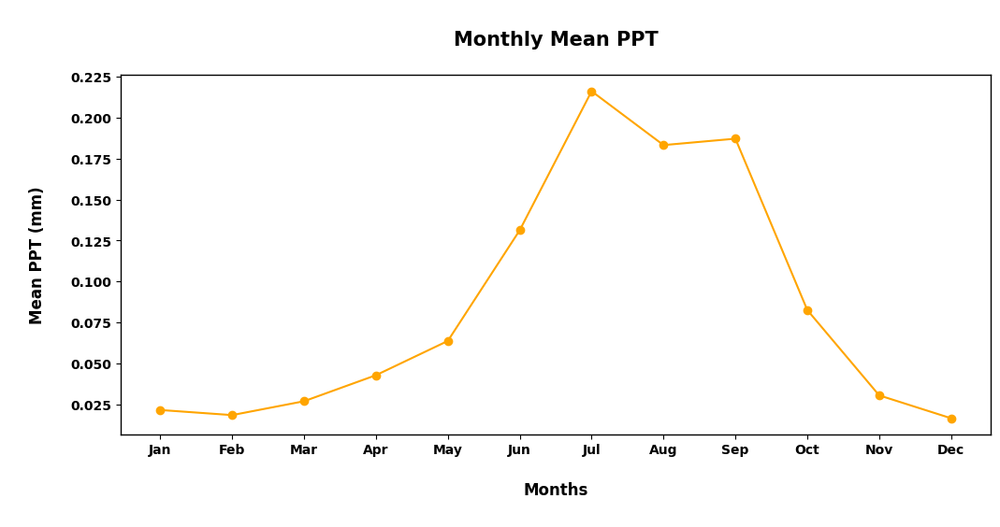

In [176]:
PPT_monthwise = PPT.groupby(PPT['time.month'])

PPT_monthwise_mean = PPT_monthwise.mean(dim=('x', 'y', 'time'))

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.figure(figsize=(12, 5))

plt.plot(months, PPT_monthwise_mean, marker='o', color='Orange')

plt.title('\nMonthly Mean PPT\n', fontsize=15, fontweight='bold')
plt.xlabel('\nMonths\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean PPT (mm)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.show()

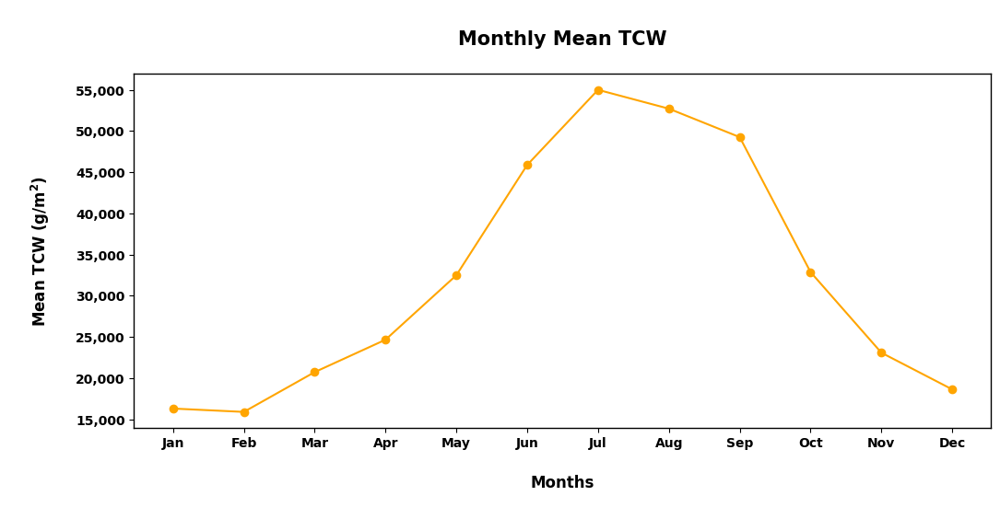

In [166]:
TCW_monthwise = TCW.groupby(TCW['time.month'])

TCW_monthwise_mean = TCW_monthwise.mean(dim=('x', 'y', 'time'))

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.figure(figsize=(12, 5))

plt.plot(months, TCW_monthwise_mean, marker='o', color='Orange')

plt.title('\nMonthly Mean TCW\n', fontsize=15, fontweight='bold')
plt.xlabel('\nMonths\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean TCW (g/m$^{\mathbf{2}}$)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.show()

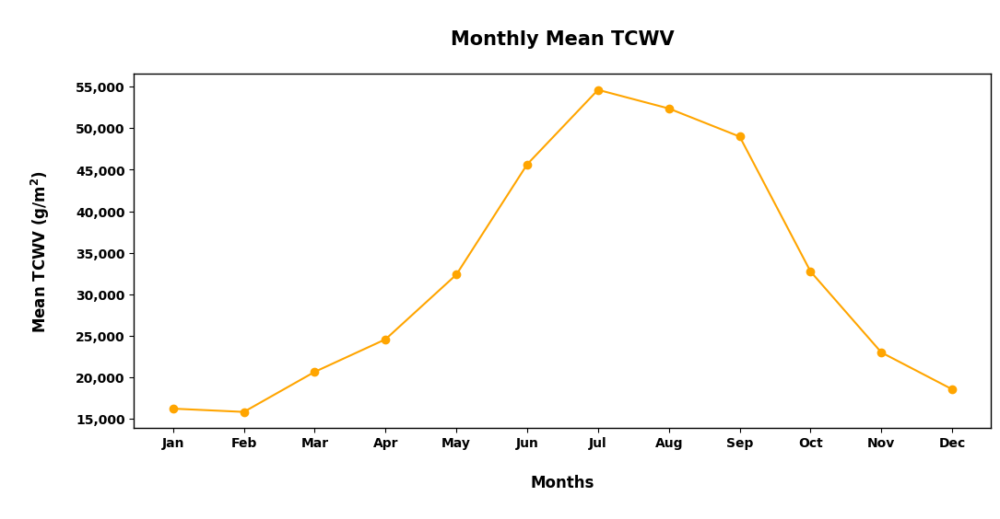

In [167]:
TCWV_monthwise = TCWV.groupby(TCWV['time.month'])

TCWV_monthwise_mean = TCWV_monthwise.mean(dim=('x', 'y', 'time'))

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.figure(figsize=(12, 5))

plt.plot(months, TCWV_monthwise_mean, marker='o', color='Orange')

plt.title('\nMonthly Mean TCWV\n', fontsize=15, fontweight='bold')
plt.xlabel('\nMonths\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean TCWV (g/m$^{\mathbf{2}}$)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.show()

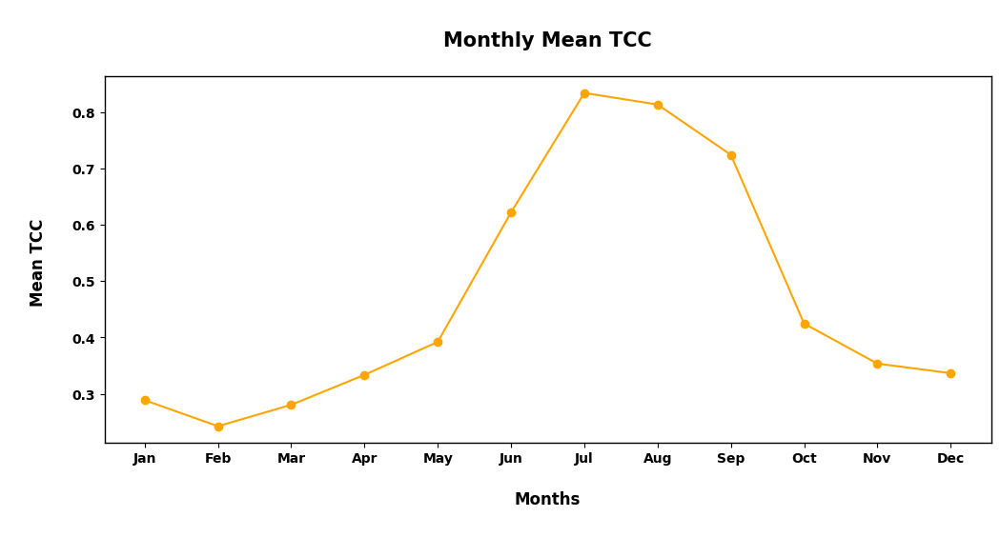

In [175]:
TCC_monthwise = TCC.groupby(TCC['time.month'])

TCC_monthwise_mean = TCC_monthwise.mean(dim=('x', 'y', 'time'))

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.figure(figsize=(12, 5))

plt.plot(months, TCC_monthwise_mean, marker='o', color='Orange')

plt.title('\nMonthly Mean TCC\n', fontsize=15, fontweight='bold')
plt.xlabel('\nMonths\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean TCC \n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.show()

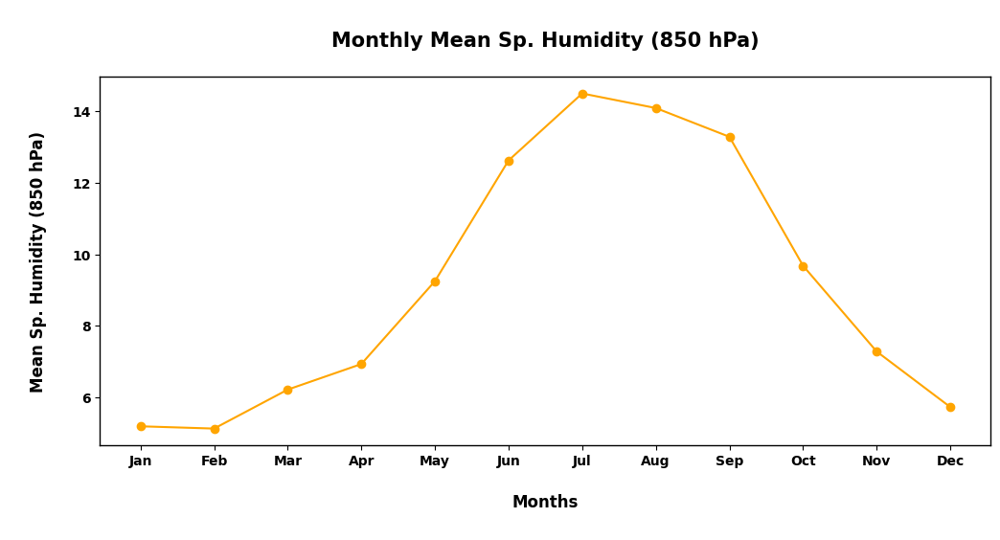

In [203]:
SP_HUM_850_monthwise = SP_HUM_850.groupby(SP_HUM_850['time.month'])

SP_HUM_850_monthwise_mean = SP_HUM_850_monthwise.mean(dim=('x', 'y', 'time'))

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.figure(figsize=(12, 5))

plt.plot(months, SP_HUM_850_monthwise_mean, marker='o', color='Orange')

plt.title('\nMonthly Mean Sp. Humidity (850 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('\nMonths\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean Sp. Humidity (850 hPa)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.show()

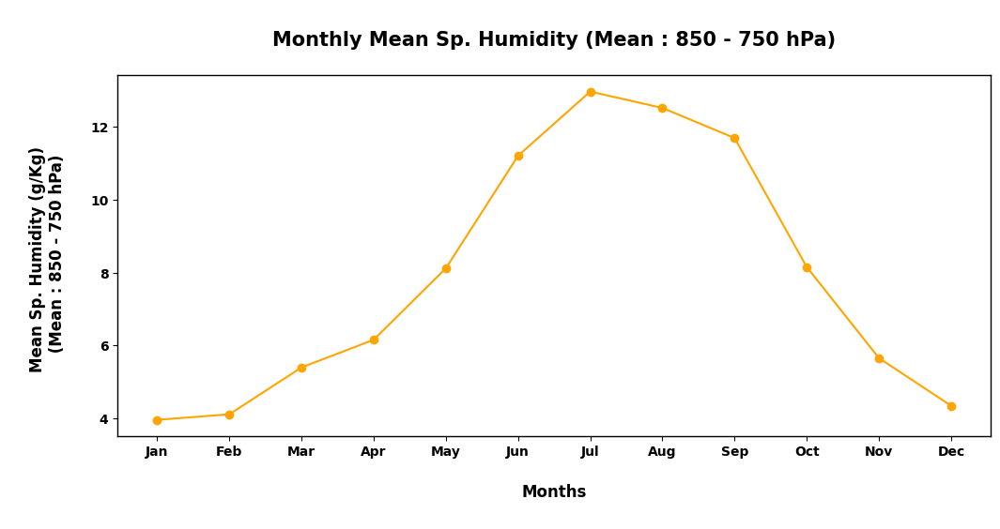

In [202]:
MEAN_SP_HUM_850_750_monthwise = MEAN_SP_HUM_850_750.groupby(MEAN_SP_HUM_850_750['time.month'])

MEAN_SP_HUM_850_750_monthwise_mean = MEAN_SP_HUM_850_750_monthwise.mean(dim=('x', 'y', 'time'))

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.figure(figsize=(12, 5))

plt.plot(months, MEAN_SP_HUM_850_750_monthwise_mean, marker='o', color='Orange')

plt.title('\nMonthly Mean Sp. Humidity (Mean : 850 - 750 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('\nMonths\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean Sp. Humidity (g/Kg) \n (Mean : 850 - 750 hPa)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.show()

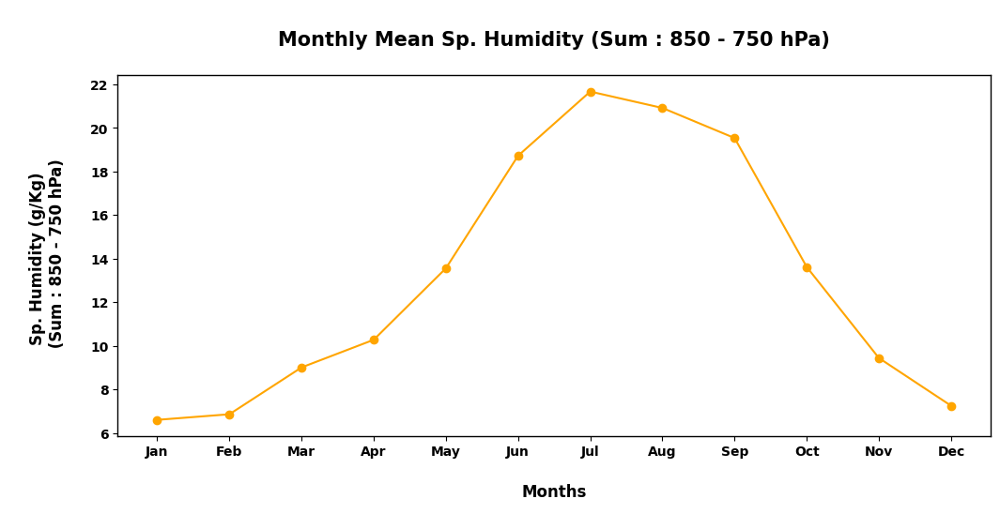

In [201]:
SUM_SP_HUM_850_750_monthwise = SUM_SP_HUM_850_750.groupby(SUM_SP_HUM_850_750['time.month'])

SUM_SP_HUM_850_750_monthwise_mean = SUM_SP_HUM_850_750_monthwise.mean(dim=('x', 'y', 'time'))

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.figure(figsize=(12, 5))

plt.plot(months, SUM_SP_HUM_850_750_monthwise_mean, marker='o', color='Orange')

plt.title('\nMonthly Mean Sp. Humidity (Sum : 850 - 750 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('\nMonths\n', fontsize=12, fontweight='bold')
plt.ylabel('\nSp. Humidity (g/Kg) \n (Sum : 850 - 750 hPa)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.show()

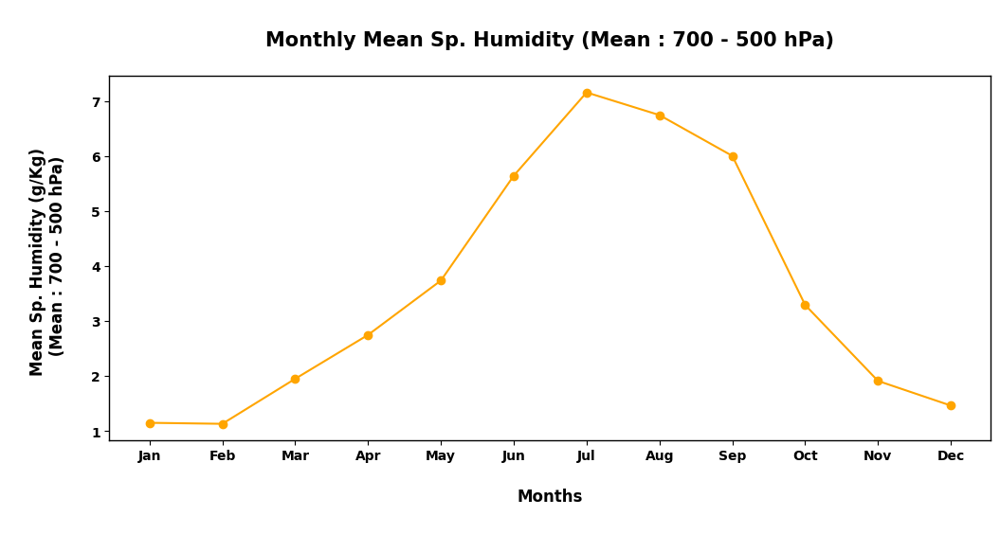

In [200]:
MEAN_SP_HUM_700_500_monthwise = MEAN_SP_HUM_700_500.groupby(MEAN_SP_HUM_700_500['time.month'])

MEAN_SP_HUM_700_500_monthwise_mean = MEAN_SP_HUM_700_500_monthwise.mean(dim=('x', 'y', 'time'))

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.figure(figsize=(12, 5))

plt.plot(months, MEAN_SP_HUM_700_500_monthwise_mean, marker='o', color='Orange')

plt.title('\nMonthly Mean Sp. Humidity (Mean : 700 - 500 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('\nMonths\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean Sp. Humidity (g/Kg) \n (Mean : 700 - 500 hPa)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.show()

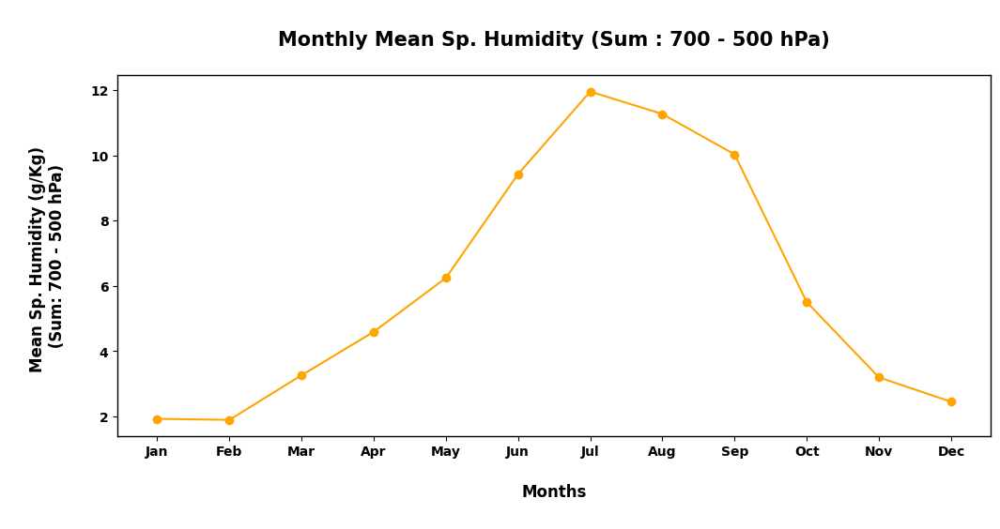

In [199]:
SUM_SP_HUM_700_500_monthwise = SUM_SP_HUM_700_500.groupby(SUM_SP_HUM_700_500['time.month'])

SUM_SP_HUM_700_500_monthwise_mean = SUM_SP_HUM_700_500_monthwise.mean(dim=('x', 'y', 'time'))

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.figure(figsize=(12, 5))

plt.plot(months, SUM_SP_HUM_700_500_monthwise_mean, marker='o', color='Orange')

plt.title('\nMonthly Mean Sp. Humidity (Sum : 700 - 500 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('\nMonths\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean Sp. Humidity (g/Kg) \n (Sum: 700 - 500 hPa) \n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.show()

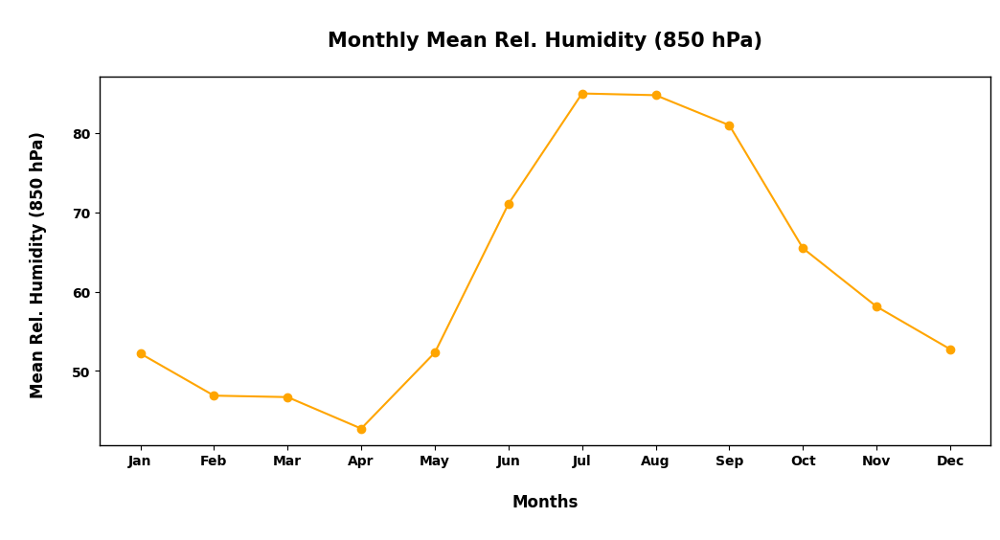

In [198]:
REL_HUM_850_monthwise = REL_HUM_850.groupby(REL_HUM_850['time.month'])

REL_HUM_850_monthwise_mean = REL_HUM_850_monthwise.mean(dim=('x', 'y', 'time'))

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.figure(figsize=(12, 5))

plt.plot(months, REL_HUM_850_monthwise_mean, marker='o', color='Orange')

plt.title('\nMonthly Mean Rel. Humidity (850 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('\nMonths\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean Rel. Humidity (850 hPa) \n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.show()

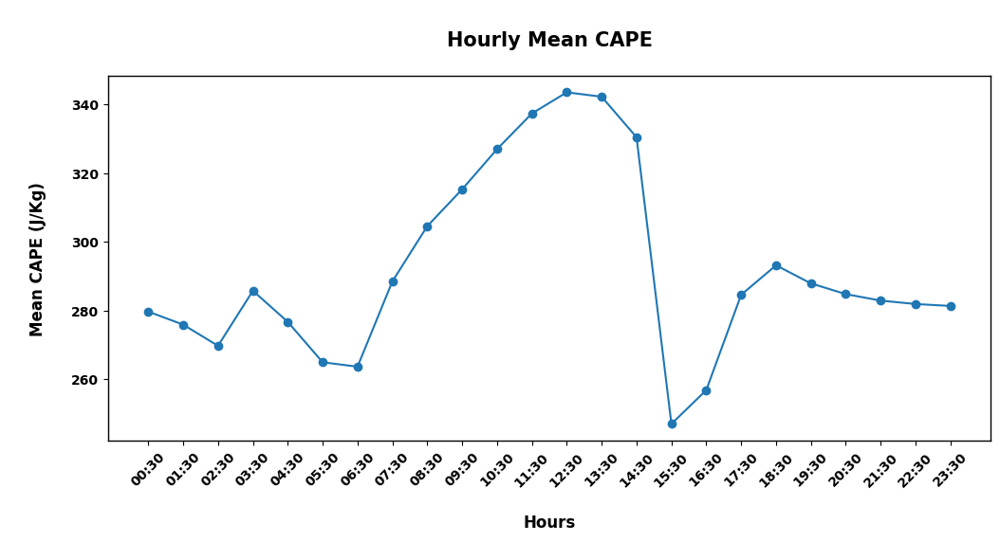

In [181]:
CAPE_hourwise = CAPE.groupby(CAPE['time.hour'])

CAPE_hourwise_mean = CAPE_hourwise.mean(dim=('x', 'y', 'time'))

# hours = ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23']
hours = ['00:30', '01:30', '02:30', '03:30', '04:30', '05:30', '06:30', '07:30', '08:30', '09:30', '10:30', '11:30', '12:30', '13:30', '14:30', '15:30', '16:30', '17:30', '18:30', '19:30', '20:30', '21:30', '22:30', '23:30']

plt.figure(figsize=(12, 5))

plt.plot(hours, CAPE_hourwise_mean, marker='o')

plt.title('\nHourly Mean CAPE\n', fontsize=15, fontweight='bold')
plt.xlabel('\nHours\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean CAPE (J/Kg)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')

plt.gca().yaxis.set_major_formatter(formatter)

ax = plt.gca()
ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.xticks(rotation=45)  
plt.show()

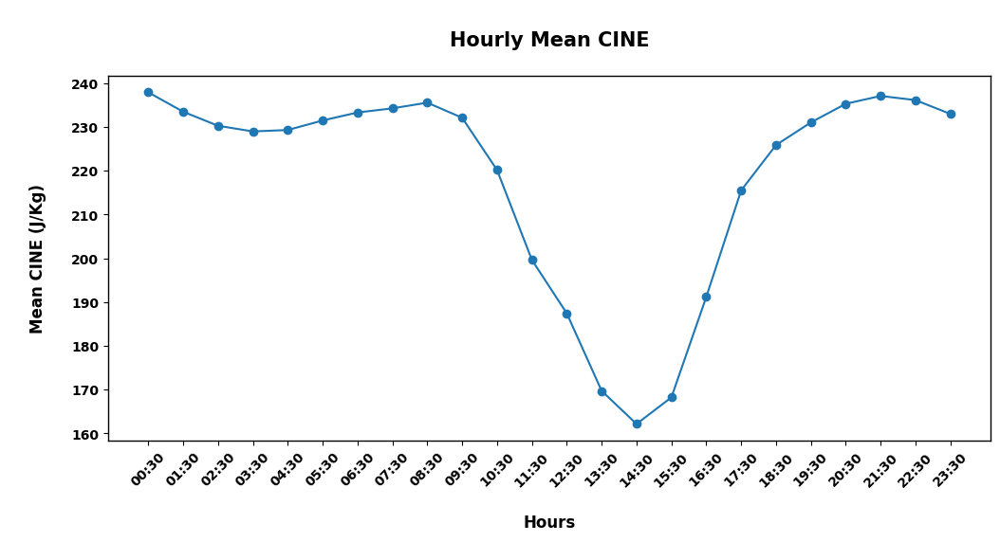

In [182]:
CINE_hourwise = CINE.groupby(CINE['time.hour'])

CINE_hourwise_mean = CINE_hourwise.mean(dim=('x', 'y', 'time'))

# hours = ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23']
hours = ['00:30', '01:30', '02:30', '03:30', '04:30', '05:30', '06:30', '07:30', '08:30', '09:30', '10:30', '11:30', '12:30', '13:30', '14:30', '15:30', '16:30', '17:30', '18:30', '19:30', '20:30', '21:30', '22:30', '23:30']

plt.figure(figsize=(12, 5))

plt.plot(hours, CINE_hourwise_mean, marker='o')

plt.title('\nHourly Mean CINE\n', fontsize=15, fontweight='bold')
plt.xlabel('\nHours\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean CINE (J/Kg)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')

ax = plt.gca()
ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.xticks(rotation=45)  
plt.show()

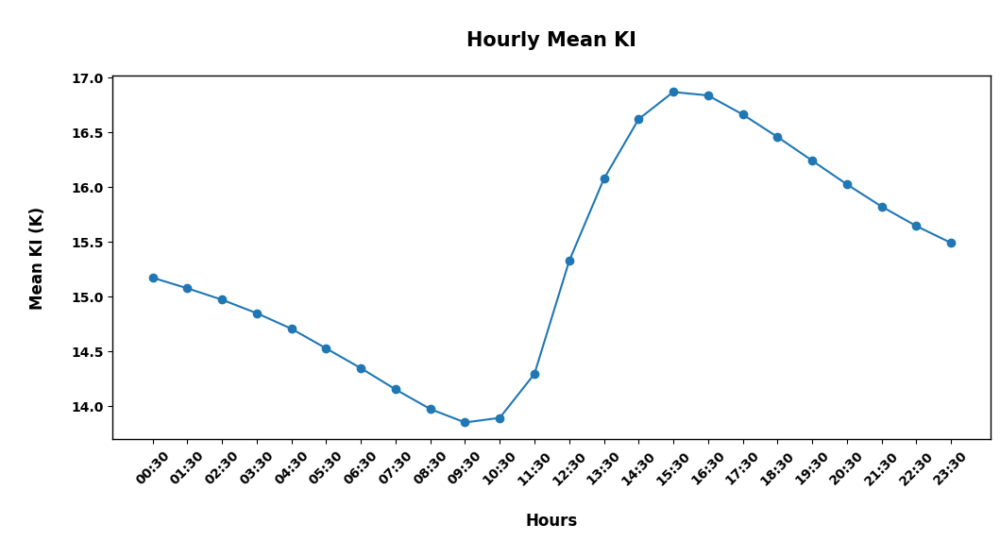

In [197]:
KI_hourwise = KI.groupby(KI['time.hour'])

KI_hourwise_mean = KI_hourwise.mean(dim=('x', 'y', 'time'))

# hours = ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23']
hours = ['00:30', '01:30', '02:30', '03:30', '04:30', '05:30', '06:30', '07:30', '08:30', '09:30', '10:30', '11:30', '12:30', '13:30', '14:30', '15:30', '16:30', '17:30', '18:30', '19:30', '20:30', '21:30', '22:30', '23:30']

plt.figure(figsize=(12, 5))

plt.plot(hours, KI_hourwise_mean, marker='o')

plt.title('\nHourly Mean KI\n', fontsize=15, fontweight='bold')
plt.xlabel('\nHours\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean KI (K)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')

ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.xticks(rotation=45)  
plt.show()

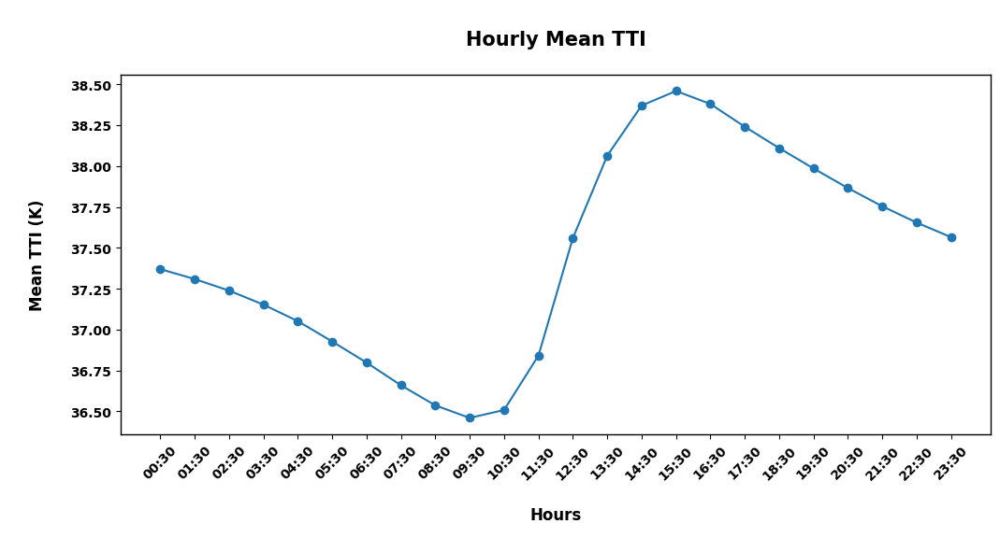

In [196]:
TTI_hourwise = TTI.groupby(TTI['time.hour'])

TTI_hourwise_mean = TTI_hourwise.mean(dim=('x', 'y', 'time'))

# hours = ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23']
hours = ['00:30', '01:30', '02:30', '03:30', '04:30', '05:30', '06:30', '07:30', '08:30', '09:30', '10:30', '11:30', '12:30', '13:30', '14:30', '15:30', '16:30', '17:30', '18:30', '19:30', '20:30', '21:30', '22:30', '23:30']

plt.figure(figsize=(12, 5))

plt.plot(hours, TTI_hourwise_mean, marker='o')

plt.title('\nHourly Mean TTI\n', fontsize=15, fontweight='bold')
plt.xlabel('\nHours\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean TTI (K)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')

ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.xticks(rotation=45)  
plt.show()

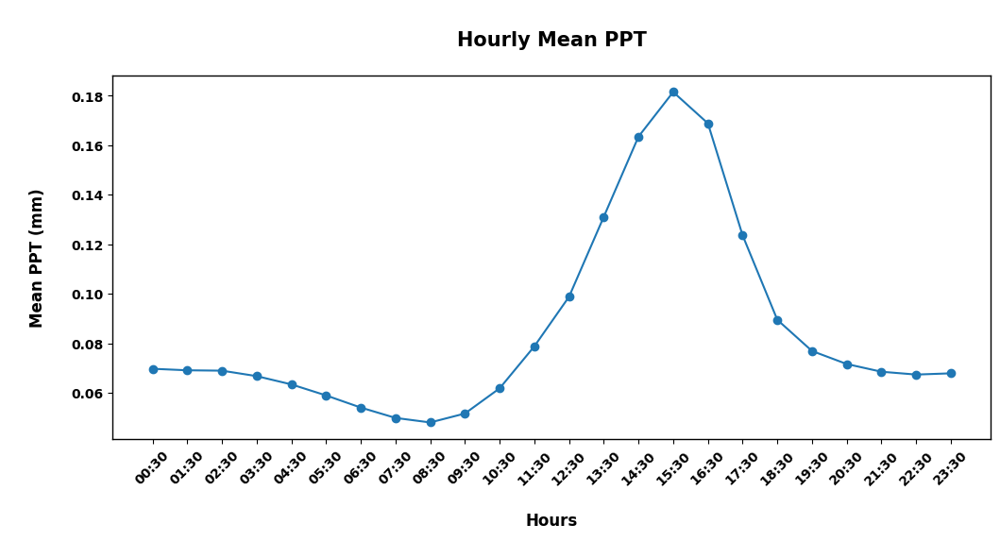

In [185]:
PPT_hourwise = PPT.groupby(PPT['time.hour'])

PPT_hourwise_mean = PPT_hourwise.mean(dim=('x', 'y', 'time'))

# hours = ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23']
hours = ['00:30', '01:30', '02:30', '03:30', '04:30', '05:30', '06:30', '07:30', '08:30', '09:30', '10:30', '11:30', '12:30', '13:30', '14:30', '15:30', '16:30', '17:30', '18:30', '19:30', '20:30', '21:30', '22:30', '23:30']

plt.figure(figsize=(12, 5))

plt.plot(hours, PPT_hourwise_mean, marker='o')

plt.title('\nHourly Mean PPT\n', fontsize=15, fontweight='bold')
plt.xlabel('\nHours\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean PPT (mm)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')

ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.xticks(rotation=45)  
plt.show()

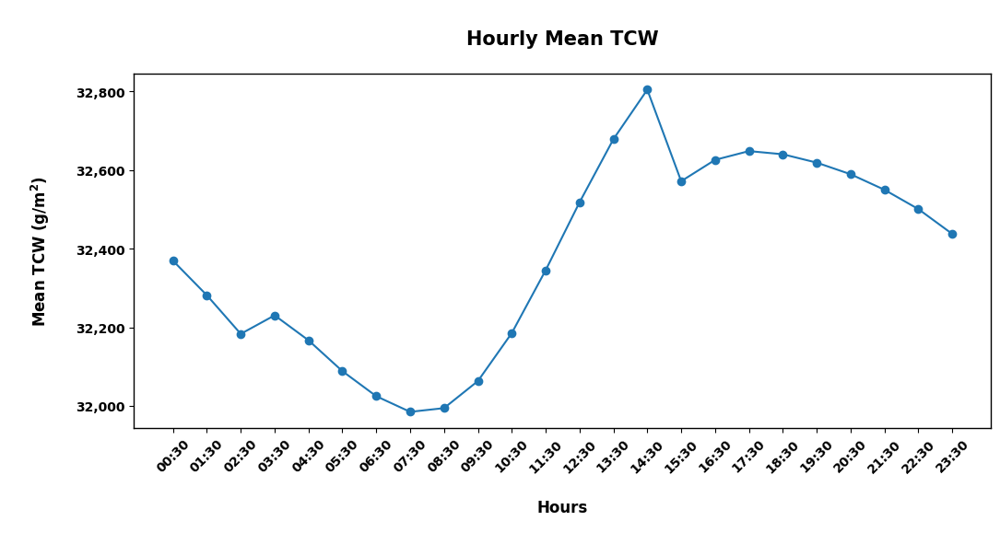

In [186]:
TCW_hourwise = TCW.groupby(TCW['time.hour'])

TCW_hourwise_mean = TCW_hourwise.mean(dim=('x', 'y', 'time'))

# hours = ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23']
hours = ['00:30', '01:30', '02:30', '03:30', '04:30', '05:30', '06:30', '07:30', '08:30', '09:30', '10:30', '11:30', '12:30', '13:30', '14:30', '15:30', '16:30', '17:30', '18:30', '19:30', '20:30', '21:30', '22:30', '23:30']

plt.figure(figsize=(12, 5))

plt.plot(hours, TCW_hourwise_mean, marker='o')

plt.title('\nHourly Mean TCW\n', fontsize=15, fontweight='bold')
plt.xlabel('\nHours\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean TCW (g/m$^{\mathbf{2}}$)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.xticks(rotation=45)  
plt.show()

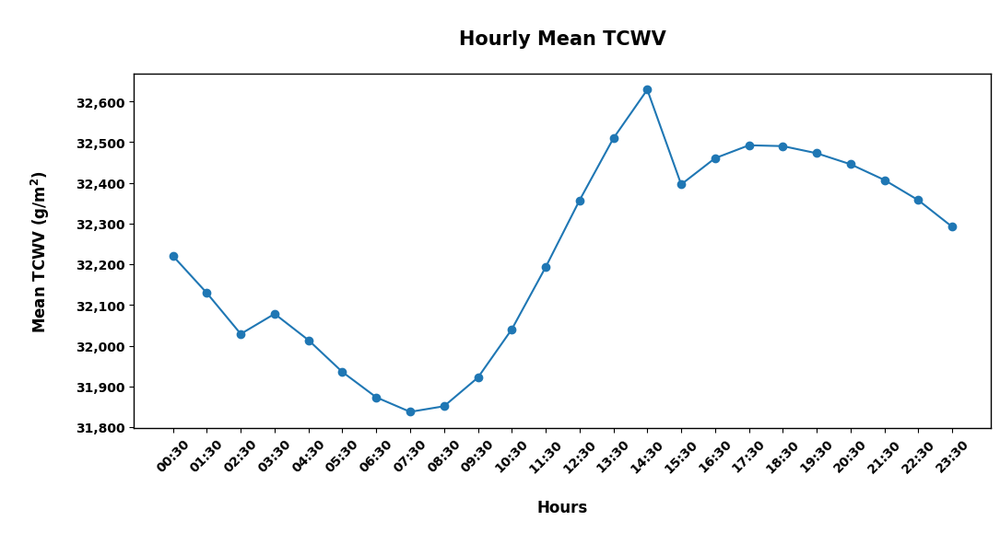

In [187]:
TCWV_hourwise = TCWV.groupby(TCWV['time.hour'])

TCWV_hourwise_mean = TCWV_hourwise.mean(dim=('x', 'y', 'time'))

# hours = ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23']
hours = ['00:30', '01:30', '02:30', '03:30', '04:30', '05:30', '06:30', '07:30', '08:30', '09:30', '10:30', '11:30', '12:30', '13:30', '14:30', '15:30', '16:30', '17:30', '18:30', '19:30', '20:30', '21:30', '22:30', '23:30']

plt.figure(figsize=(12, 5))

plt.plot(hours, TCWV_hourwise_mean, marker='o')

plt.title('\nHourly Mean TCWV\n', fontsize=15, fontweight='bold')
plt.xlabel('\nHours\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean TCWV (g/m$^{\mathbf{2}}$)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.xticks(rotation=45)  
plt.show()

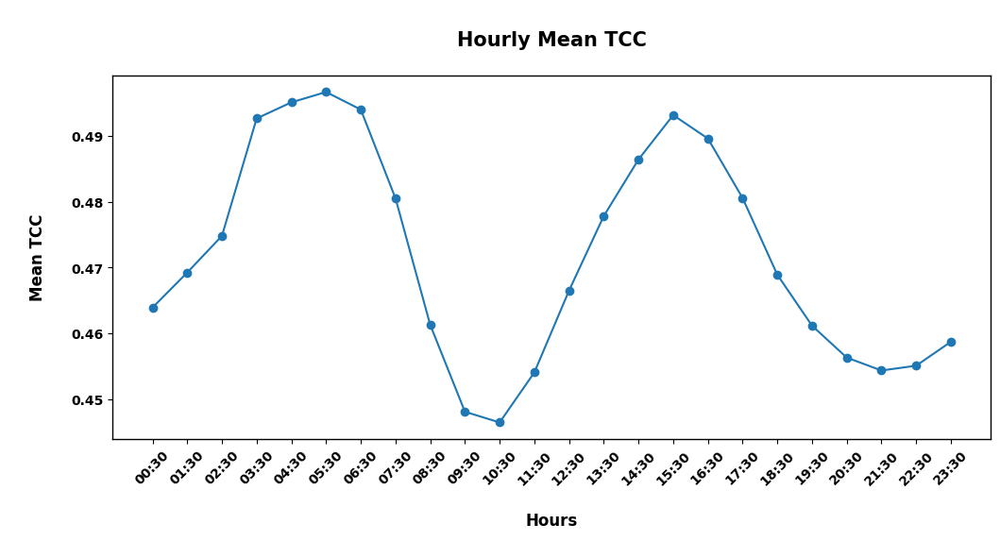

In [188]:
TCC_hourwise = TCC.groupby(TCC['time.hour'])

TCC_hourwise_mean = TCC_hourwise.mean(dim=('x', 'y', 'time'))

# hours = ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23']
hours = ['00:30', '01:30', '02:30', '03:30', '04:30', '05:30', '06:30', '07:30', '08:30', '09:30', '10:30', '11:30', '12:30', '13:30', '14:30', '15:30', '16:30', '17:30', '18:30', '19:30', '20:30', '21:30', '22:30', '23:30']

plt.figure(figsize=(12, 5))

plt.plot(hours, TCC_hourwise_mean, marker='o')

plt.title('\nHourly Mean TCC\n', fontsize=15, fontweight='bold')
plt.xlabel('\nHours\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean TCC\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.xticks(rotation=45)  
plt.show()

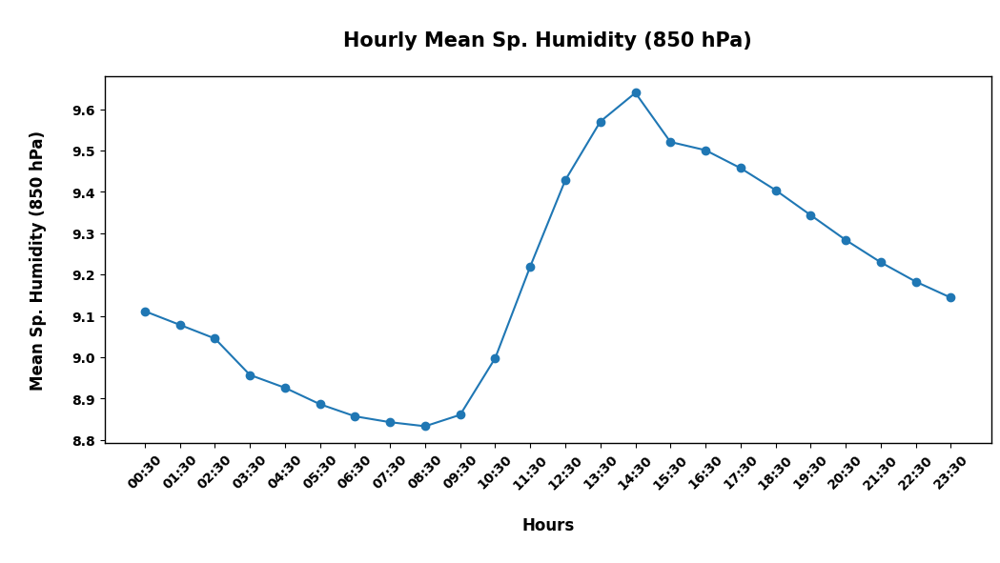

In [189]:
SP_HUM_850_hourwise = SP_HUM_850.groupby(SP_HUM_850['time.hour'])

SP_HUM_850_hourwise_mean = SP_HUM_850_hourwise.mean(dim=('x', 'y', 'time'))

# hours = ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23']
hours = ['00:30', '01:30', '02:30', '03:30', '04:30', '05:30', '06:30', '07:30', '08:30', '09:30', '10:30', '11:30', '12:30', '13:30', '14:30', '15:30', '16:30', '17:30', '18:30', '19:30', '20:30', '21:30', '22:30', '23:30']

plt.figure(figsize=(12, 5))

plt.plot(hours, SP_HUM_850_hourwise_mean, marker='o')

plt.title('\nHourly Mean Sp. Humidity (850 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('\nHours\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean Sp. Humidity (850 hPa)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.xticks(rotation=45)  
plt.show()

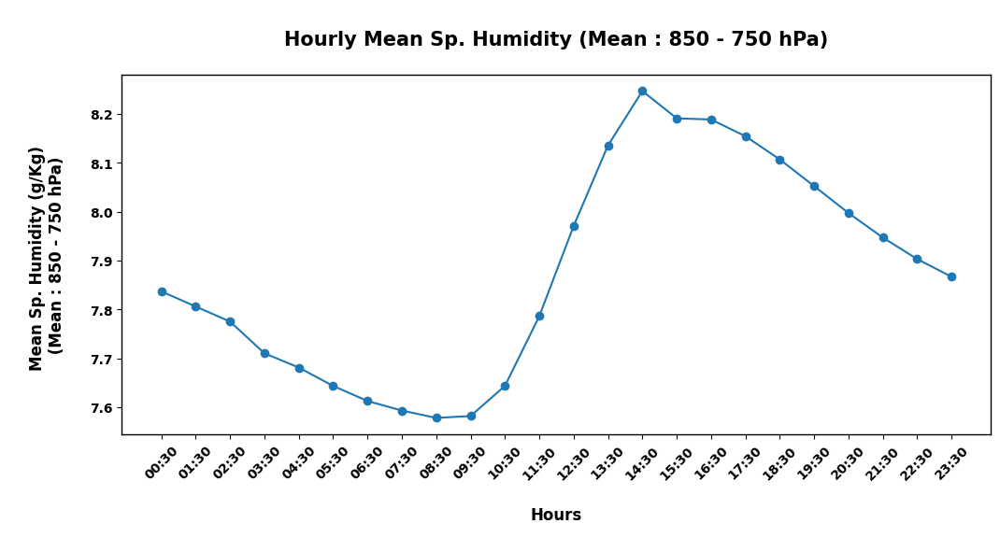

In [190]:
MEAN_SP_HUM_850_750_hourwise = MEAN_SP_HUM_850_750.groupby(MEAN_SP_HUM_850_750['time.hour'])

MEAN_SP_HUM_850_750_hourwise_mean = MEAN_SP_HUM_850_750_hourwise.mean(dim=('x', 'y', 'time'))

# hours = ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23']
hours = ['00:30', '01:30', '02:30', '03:30', '04:30', '05:30', '06:30', '07:30', '08:30', '09:30', '10:30', '11:30', '12:30', '13:30', '14:30', '15:30', '16:30', '17:30', '18:30', '19:30', '20:30', '21:30', '22:30', '23:30']

plt.figure(figsize=(12, 5))

plt.plot(hours, MEAN_SP_HUM_850_750_hourwise_mean, marker='o')

plt.title('\nHourly Mean Sp. Humidity (Mean : 850 - 750 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('\nHours\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean Sp. Humidity (g/Kg) \n (Mean : 850 - 750 hPa) \n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.xticks(rotation=45)  
plt.show()

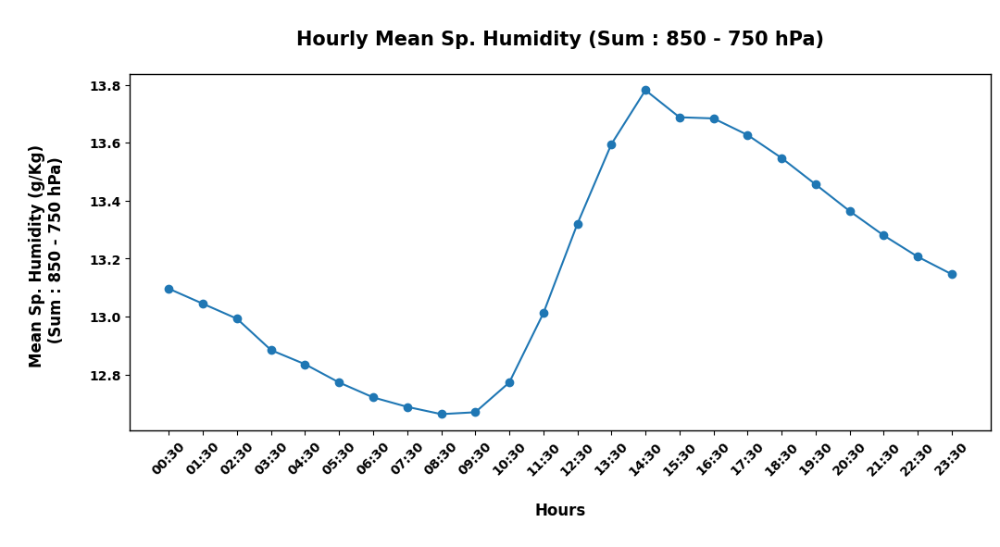

In [191]:
SUM_SP_HUM_850_750_hourwise = SUM_SP_HUM_850_750.groupby(SUM_SP_HUM_850_750['time.hour'])

SUM_SP_HUM_850_750_hourwise_mean = SUM_SP_HUM_850_750_hourwise.mean(dim=('x', 'y', 'time'))

# hours = ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23']
hours = ['00:30', '01:30', '02:30', '03:30', '04:30', '05:30', '06:30', '07:30', '08:30', '09:30', '10:30', '11:30', '12:30', '13:30', '14:30', '15:30', '16:30', '17:30', '18:30', '19:30', '20:30', '21:30', '22:30', '23:30']

plt.figure(figsize=(12, 5))

plt.plot(hours, SUM_SP_HUM_850_750_hourwise_mean, marker='o')

plt.title('\nHourly Mean Sp. Humidity (Sum : 850 - 750 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('\nHours\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean Sp. Humidity (g/Kg) \n (Sum : 850 - 750 hPa)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.xticks(rotation=45)  
plt.show()

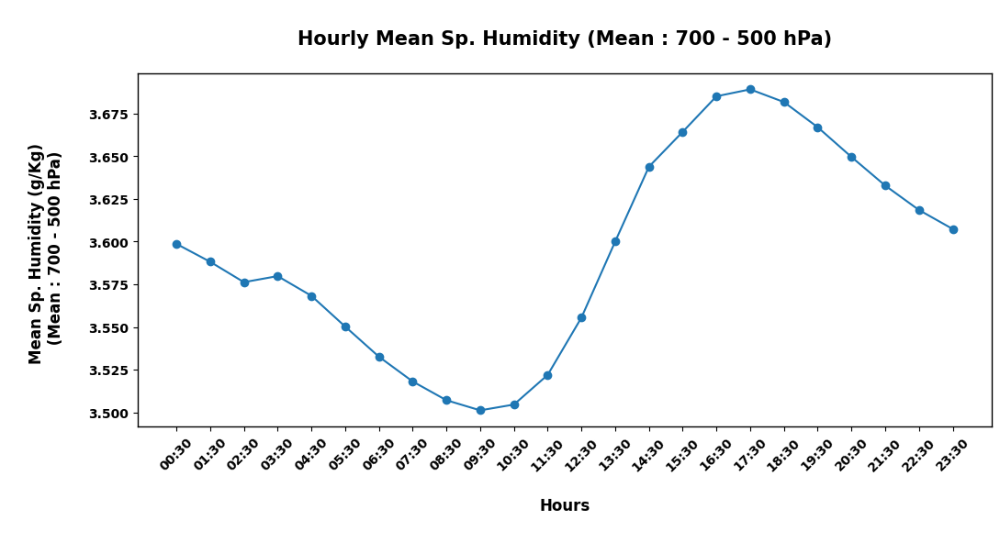

In [192]:
MEAN_SP_HUM_700_500_hourwise = MEAN_SP_HUM_700_500.groupby(MEAN_SP_HUM_700_500['time.hour'])

MEAN_SP_HUM_700_500_hourwise_mean = MEAN_SP_HUM_700_500_hourwise.mean(dim=('x', 'y', 'time'))

# hours = ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23']
hours = ['00:30', '01:30', '02:30', '03:30', '04:30', '05:30', '06:30', '07:30', '08:30', '09:30', '10:30', '11:30', '12:30', '13:30', '14:30', '15:30', '16:30', '17:30', '18:30', '19:30', '20:30', '21:30', '22:30', '23:30']

plt.figure(figsize=(12, 5))

plt.plot(hours, MEAN_SP_HUM_700_500_hourwise_mean, marker='o')

plt.title('\nHourly Mean Sp. Humidity (Mean : 700 - 500 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('\nHours\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean Sp. Humidity (g/Kg) \n (Mean : 700 - 500 hPa)\n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.xticks(rotation=45)  
plt.show()

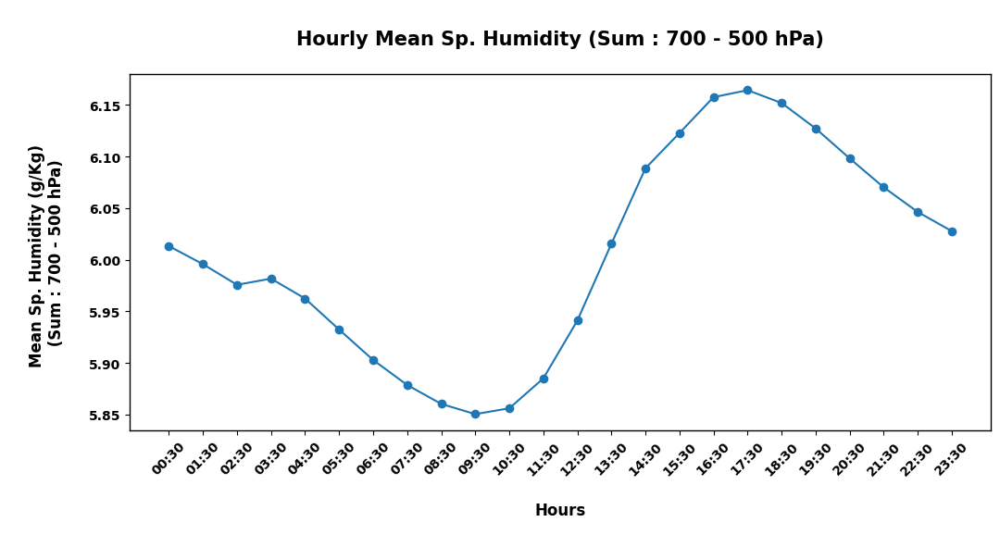

In [193]:
SUM_SP_HUM_700_500_hourwise = SUM_SP_HUM_700_500.groupby(SUM_SP_HUM_700_500['time.hour'])

SUM_SP_HUM_700_500_hourwise_mean = SUM_SP_HUM_700_500_hourwise.mean(dim=('x', 'y', 'time'))

# hours = ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23']
hours = ['00:30', '01:30', '02:30', '03:30', '04:30', '05:30', '06:30', '07:30', '08:30', '09:30', '10:30', '11:30', '12:30', '13:30', '14:30', '15:30', '16:30', '17:30', '18:30', '19:30', '20:30', '21:30', '22:30', '23:30']

plt.figure(figsize=(12, 5))

plt.plot(hours, SUM_SP_HUM_700_500_hourwise_mean, marker='o')

plt.title('\nHourly Mean Sp. Humidity (Sum : 700 - 500 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('\nHours\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean Sp. Humidity (g/Kg) \n (Sum : 700 - 500 hPa) \n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.xticks(rotation=45)  
plt.show()

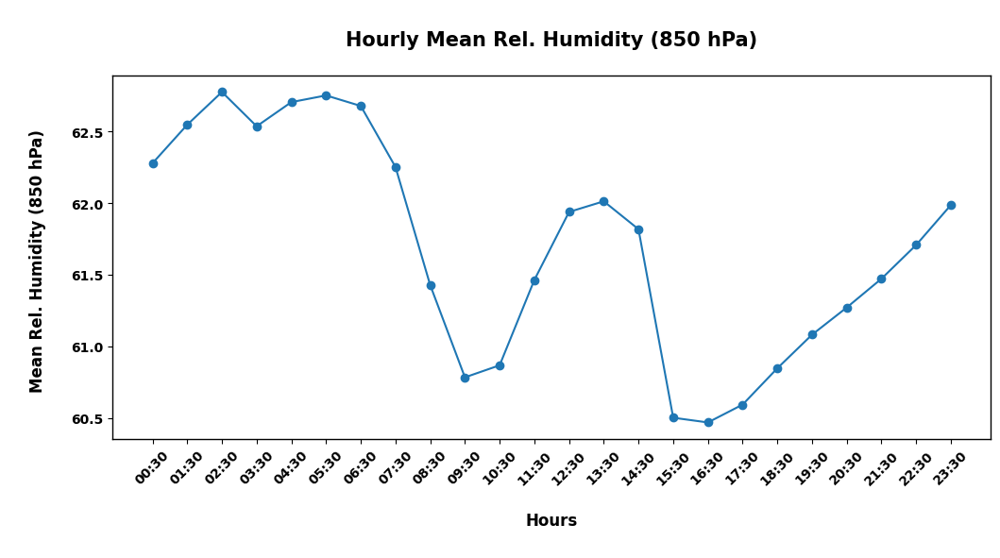

In [195]:
REL_HUM_850_hourwise = REL_HUM_850.groupby(REL_HUM_850['time.hour'])

REL_HUM_850_hourwise_mean = REL_HUM_850_hourwise.mean(dim=('x', 'y', 'time'))

# hours = ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23']
hours = ['00:30', '01:30', '02:30', '03:30', '04:30', '05:30', '06:30', '07:30', '08:30', '09:30', '10:30', '11:30', '12:30', '13:30', '14:30', '15:30', '16:30', '17:30', '18:30', '19:30', '20:30', '21:30', '22:30', '23:30']

plt.figure(figsize=(12, 5))

plt.plot(hours, REL_HUM_850_hourwise_mean, marker='o')

plt.title('\nHourly Mean Rel. Humidity (850 hPa)\n', fontsize=15, fontweight='bold')
plt.xlabel('\nHours\n', fontsize=12, fontweight='bold')
plt.ylabel('\nMean Rel. Humidity (850 hPa) \n', fontsize=12, fontweight='bold')

plt.yticks(fontsize=10, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax = plt.gca()
# ax.yaxis.set_major_formatter(formatter)
ax.spines['top'].set_linewidth(1)
ax.spines['right'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)

plt.xticks(rotation=45)  
plt.show()